In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import os

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as op

# from  sklearn import preprocessing
from torch.utils.data import Dataset, DataLoader

import matplotlib.pyplot as plt
from anndata import AnnData

from tqdm import trange
import random

from scipy.ndimage.filters import gaussian_filter
from matplotlib import font_manager as fm

/tmp/ipykernel_6880/2414236010.py:20: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter


In [2]:
def seed_torch(seed=10000):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.enabled = False

In [3]:
angle_space_pd = pd.read_csv("./Prepare_NN_Data/angle_space_SP_Add_2.csv",index_col=0)

angle_space_pd = angle_space_pd.loc[(angle_space_pd != 0).sum(1) >= 8,:]
angle_space_pd = angle_space_pd.iloc[:-1,:]

In [4]:
seed_torch(seed=2)
device = torch.device("cuda:0")

A = np.load("./Prepare_NN_Data/A_SP_Add_2.npy")
data = np.load("./Prepare_NN_Data/angle_space_SP_Add_2.npy")

data = data[(data != 0).sum(1)>= 8,:]
data = data[:-1,:]
data = (data.transpose(1,0)-data.min(1))/(data.max(1)-data.min(1))
data = data.transpose(1,0)

A = torch.from_numpy(A)
data = torch.from_numpy(data)

A = A.transpose(1,0)
A = A.to(torch.float32)
data = data.to(torch.float32)

A = A.to(device)
data = data.to(device)


# total_num = torch.randperm(data.shape[0])
# test_num = total_num[:round(len(total_num)*0.1),]
# train_num = total_num[round(len(total_num)*0.1):,]
# train_num = train_num[np.isin(train_num,[6539,2646,1965,6186,2224,2463,1758,9199,9186],invert=True)] 

total_num = torch.randperm(data.shape[0])
train_num = total_num
# test_num = [6539,2646,1965,6186,2224,2463,1758,9199,9186]
# train_num = total_num[np.isin(total_num,test_num,invert=True)] 

train_data = data[train_num,:]
# test_data = data[test_num,:]

In [5]:
print(data.shape)

torch.Size([9204, 446])


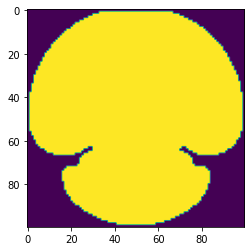

In [6]:
def place_inside_mask(values: np.ndarray, mask_bw: np.ndarray) -> np.ndarray:
    """Place the values at the position that are 1/True in mask followin the C_CONTIGUOUS enumeration order

    Args
    ----
    values: np.ndarray (1d, float)
        the vaues to fill in mask
    mask_bw: np.ndarray (2d, binary or boolean)
        the mask to fill values in
    Returns
    -------
    x: np.ndarray 2d
        2d array with the values subsittuted in the right place of the mask
    """
    # assert np.allclose(mask.sum(), len(values))
    x = np.zeros(mask_bw.shape)
    x.flat[mask_bw.flat[:].astype(bool)] = values
    return x

import h5py

config = h5py.File("./Prepare_NN_Data/nonZero_Add_2_Config.hdf5", "r")
plt.imshow(config["mask_g"][:])
mask_bw = (config["mask_g"][:] > 0.2).astype(float)

In [7]:
from typing import Any
from skimage.measure import find_contours
def show_reconstruction_raw(result: np.ndarray, mask: np.ndarray, ax: Any=None) -> None:
    cntrs = find_contours(mask, 0.1)[0]
    if ax is None:
        ax = plt.subplot(111)
    ax.plot(cntrs[:, 1], cntrs[:, 0], lw=1, c='k', ls='--')
    ax.imshow(result * mask, cmap="gray_r", interpolation="none")
    ax.tick_params(axis='both', labelleft='off', labelbottom="off")
    ax.axis("off")

In [8]:
from scipy.special import loggamma, erf, gammaln, digamma
def make_tv_ixmask(mask):
    ref_ixs_xy = []
    ref_ixs_x = []
    ref_ixs_y = []
    rows, cols = mask.shape
    mask_num = -1 * np.ones(mask.shape, dtype=int)
    mask_num.flat[mask.flat[:].astype(bool)] = np.arange(np.sum(mask))
    for r in range(0, rows - 1):
        for c in range(0, cols - 1):
            ref, right, down = mask[r, c], mask[r, c + 1], mask[r + 1, c]
            if ref:
                if right and down:
                    ref_ixs_xy.append((mask_num[r, c], mask_num[r, c + 1], mask_num[r + 1, c]))
                elif right and not down:
                    ref_ixs_x.append((mask_num[r, c], mask_num[r, c + 1]))
                elif down and not right:
                    ref_ixs_y.append((mask_num[r, c], mask_num[r + 1, c]))
    ref_ixs_xy = np.array(ref_ixs_xy)
    ref_ixs_x = np.array(ref_ixs_x)
    ref_ixs_y = np.array(ref_ixs_y)

    return torch.from_numpy(ref_ixs_xy).to(device), torch.from_numpy(ref_ixs_x).to(device), torch.from_numpy(ref_ixs_y).to(device)

def tv_masked_dlasso_ddlasso(x, ixs, s):
    ref_ixs_xy, ref_ixs_x, ref_ixs_y = ixs
    delta_x = x[:,ref_ixs_xy[:, 1]] - x[:,ref_ixs_xy[:, 0]]
    delta_y = x[:,ref_ixs_xy[:, 2]] - x[:,ref_ixs_xy[:, 0]]
    delta_x_border = x[:,ref_ixs_x[:, 1]] - x[:,ref_ixs_x[:, 0]]
    delta_y_border = x[:,ref_ixs_y[:, 1]] - x[:,ref_ixs_y[:, 0]]
    
    cum = torch.sum(dlasso(delta_x, s))
    cum = cum + torch.sum(dlasso(delta_y, s))
    cum = cum + torch.sum(dlasso(delta_x_border, s)) + torch.sum(dlasso(delta_y_border, s))

    return cum

def dlasso(x, s=0.005):
    return x * torch.erf(x/s)

In [9]:
class Simple_Net(nn.Module):
    def __init__(self,A,dropout_rate = 0.2):
        super(Simple_Net,self).__init__()
        self.A = A
        self.nnL1 = nn.Linear(in_features = 446,out_features = 2048,bias=False)
#         self.bn1 = nn.BatchNorm1d(1024)
        self.nnL2 = nn.Linear(in_features = 2048,out_features = 4096,bias=False)
#         self.bn2 = nn.BatchNorm1d(2048)
        self.nnL3 = nn.Linear(in_features = 4096,out_features = 7330,bias=False)
        self.relu = nn.ReLU()
#         self.sigmoid = nn.Sigmoid()
    def forward(self,x):

        output = self.nnL1(x)       
        output = self.relu(output)
#         output = self.bn1(output)
        output = self.nnL2(output)
        output = self.relu(output)
#         output = self.bn2(output)
        output = self.nnL3(output)
        output = self.relu(output)
        pre_raw = torch.mm(output,self.A)
        return output,pre_raw

In [10]:
ixs = make_tv_ixmask(mask_bw)

In [11]:
model = Simple_Net(A).to(device)
criterion = nn.MSELoss()

# L1_lambda = 1e-9
L2_lambda = 1e-5
sparse_lambda = 1e-7
tv_beta = 1e-7
optim = op.Adam(params=model.parameters(),lr=0.001,weight_decay=L2_lambda)

 20%|█████████████████▊                                                                       | 1000/5000 [11:37<46:35,  1.43it/s]/tmp/ipykernel_6880/1724149113.py:40: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  blurred = place_inside_mask(model(data)[0].cpu().detach()[index,:].numpy(),mask_bw)


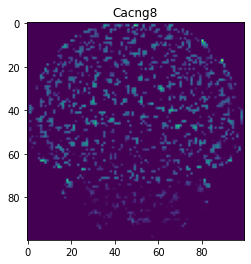

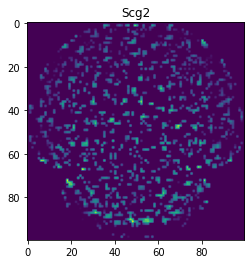

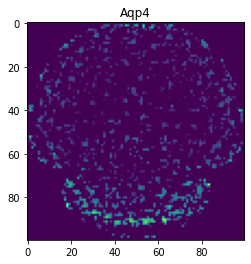

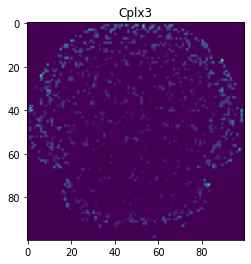

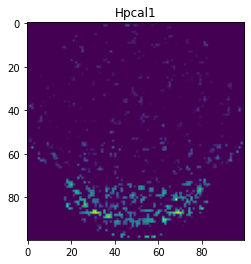

...

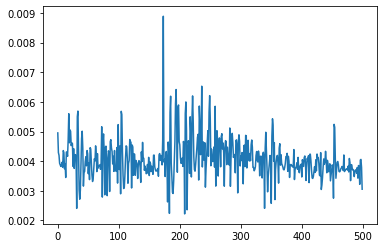

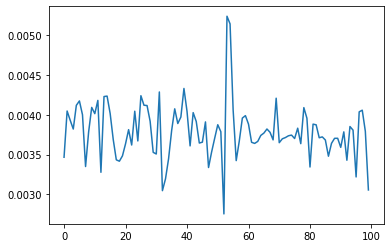

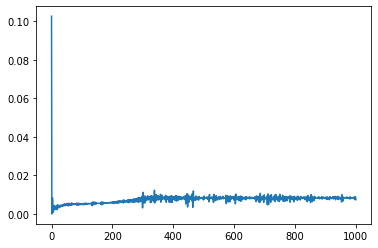

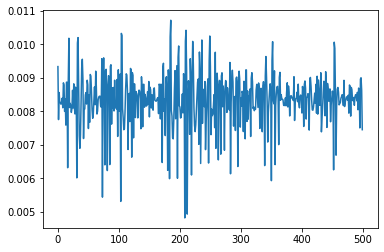

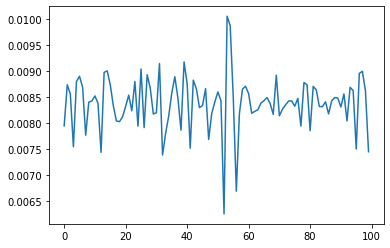

 20%|█████████████████▍                                                                     | 1002/5000 [11:42<1:34:34,  1.42s/it]

# Epoch train 1000:
 	max:18.311594009399414 	min:0.018569467589259148


 40%|███████████████████████████████████▌                                                     | 2000/5000 [23:20<34:58,  1.43it/s]

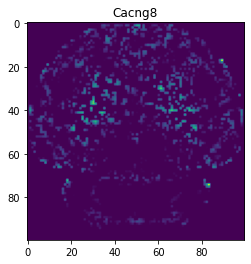

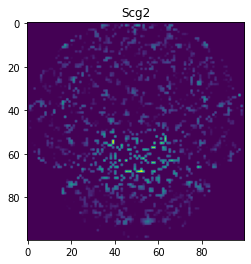

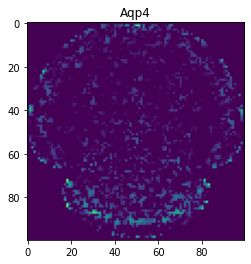

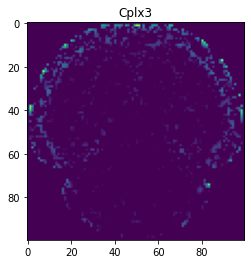

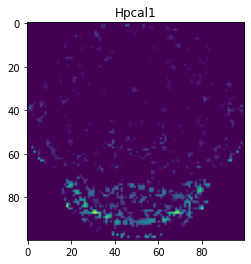

...

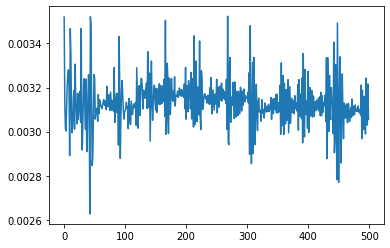

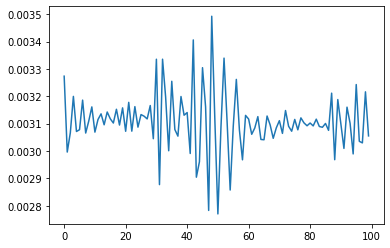

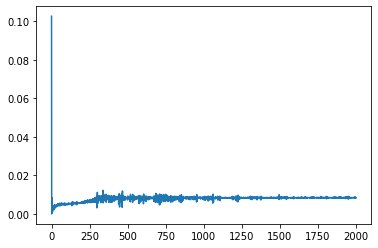

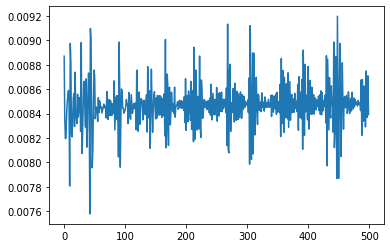

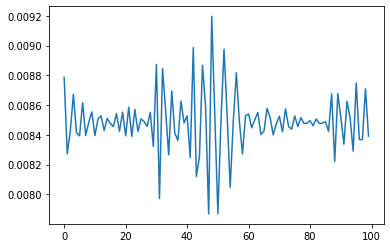

 40%|██████████████████████████████████▊                                                    | 2002/5000 [23:25<1:11:35,  1.43s/it]

# Epoch train 2000:
 	max:0.04073168337345123 	min:0.015523445792496204


 60%|█████████████████████████████████████████████████████▍                                   | 3000/5000 [35:03<23:17,  1.43it/s]

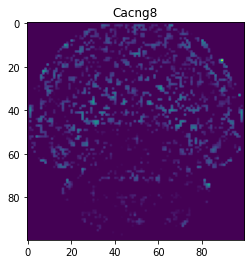

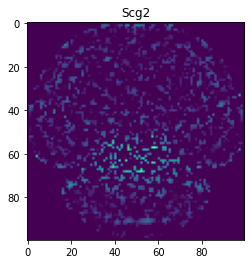

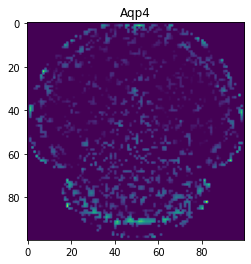

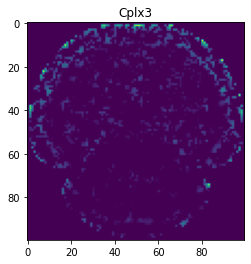

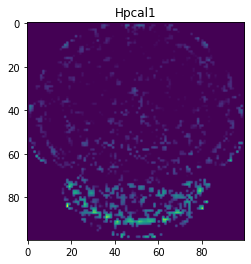

...

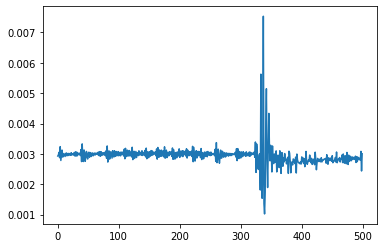

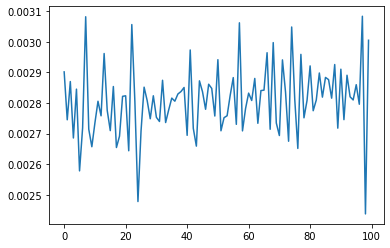

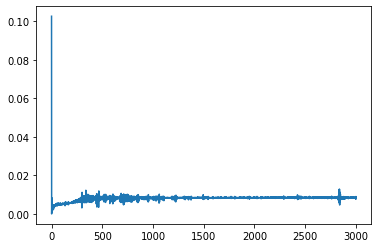

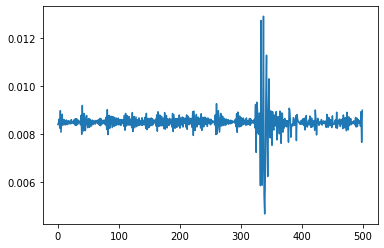

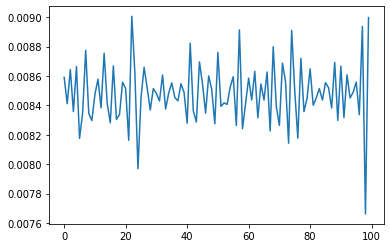

 60%|█████████████████████████████████████████████████████▍                                   | 3002/5000 [35:09<48:19,  1.45s/it]

# Epoch train 3000:
 	max:0.05833985283970833 	min:0.014549427665770054


 80%|███████████████████████████████████████████████████████████████████████▏                 | 4000/5000 [46:47<11:39,  1.43it/s]

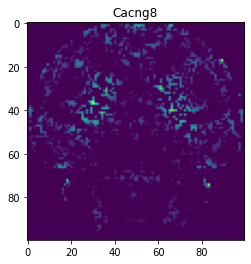

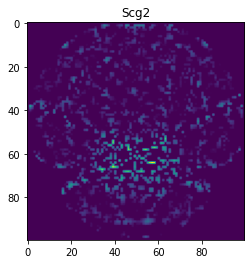

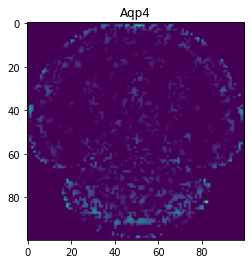

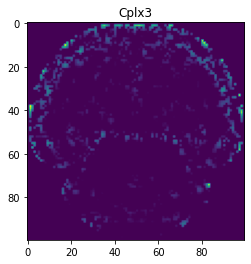

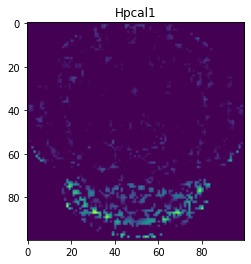

...

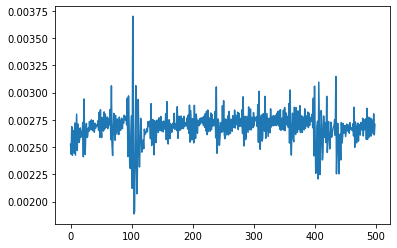

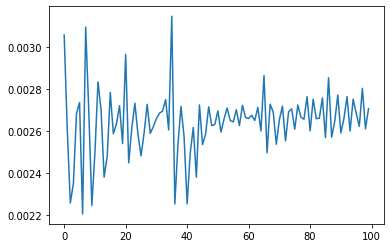

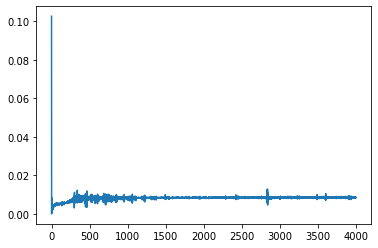

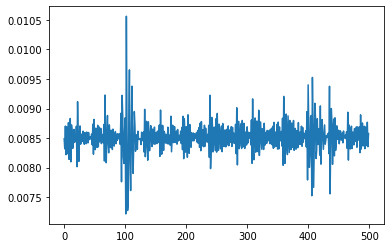

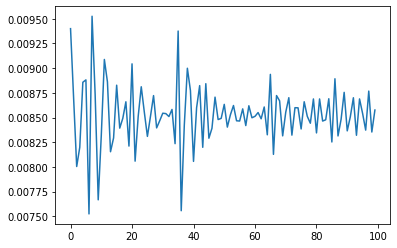

 80%|███████████████████████████████████████████████████████████████████████▏                 | 4002/5000 [46:52<23:51,  1.43s/it]

# Epoch train 4000:
 	max:0.022137895226478577 	min:0.014205379411578178


100%|█████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [58:31<00:00,  1.42it/s]


In [12]:
loss_total_train_clean = []
# loss_total_test = []
tv_loss = []

# L1_loss = []
sparse_loss = []
for j in trange(5000):
    model.train()
    loss = criterion(model(train_data)[1],train_data)
    loss_total_train_clean.append(loss.item())   
    
#     L1 = 0
#     for name,param  in model.named_parameters():
#         if "bias" not in name:  #bias不在正则化计算里面
#             L1 += param.abs().sum() #将权重的总大小作为模型复杂度来进行处罚
#     L1_loss_one = L1_lambda*L1
#     loss += L1_loss_one
#     L1_loss.append(L1_loss_one.item())

    sparse_loss_one = model(train_data)[0].abs().sum()*sparse_lambda
    loss += sparse_loss_one
    sparse_loss.append(sparse_loss_one.item())

    tv = tv_masked_dlasso_ddlasso(model(data)[0],ixs,0.05)*tv_beta
    loss += tv
    tv_loss.append(tv.item())
    
    optim.zero_grad()
    loss.backward()
    optim.step()
    
    
    
    model.eval()
#     loss_test = criterion(model(test_data)[1],test_data)
#     loss_total_test.append(loss_test.item())
    if j % 1000 == 0 and j != 0:
        for gene_name in ["Cacng8","Scg2","Aqp4","Cplx3","Hpcal1","Adcy5","Zic1","Pdf","Keap1"]:
            index = np.where(angle_space_pd.index == gene_name)
            blurred = place_inside_mask(model(data)[0].cpu().detach()[index,:].numpy(),mask_bw)
            plt.imshow(blurred)
            plt.title(gene_name)
            plt.show()
#         plt.plot(loss_total_test)
#         plt.show()
#         plt.plot(loss_total_test[-500:])
#         plt.show()
#         plt.plot(loss_total_test[-100:])
#         plt.show()
        
        plt.plot(loss_total_train_clean)
        plt.show()
        plt.plot(loss_total_train_clean[-500:])
        plt.show()
        plt.plot(loss_total_train_clean[-100:])
        plt.show()
        
        plt.plot(tv_loss)
        plt.show()
        plt.plot(tv_loss[-500:])
        plt.show()
        plt.plot(tv_loss[-100:])
        plt.show()

#         plt.plot(L1_loss)
#         plt.show()
#         plt.plot(L1_loss[-500:])
#         plt.show()
#         plt.plot(L1_loss[-100:])
#         plt.show()

                                
        plt.plot(sparse_loss)
        plt.show()
        plt.plot(sparse_loss[-500:])
        plt.show()
        plt.plot(sparse_loss[-100:])
        plt.show()
                                
        
    if j % 1000 == 0 and j != 0:
        print("# Epoch train {}:\n".format(j),
              "\tmax:{}".format(max(loss_total_train_clean[(j-1000):j])),
              "\tmin:{}".format(min(loss_total_train_clean[(j-1000):j])),
             )

#         print("# Epoch test {}:\n".format(j),
#               "\tmax:{}".format(max(loss_total_test[(j-1000):j])),
#               "\tmin:{}".format(min(loss_total_test[(j-1000):j])),
#              )


In [49]:
torch.save(model, 'DeepTomo_final.pt')

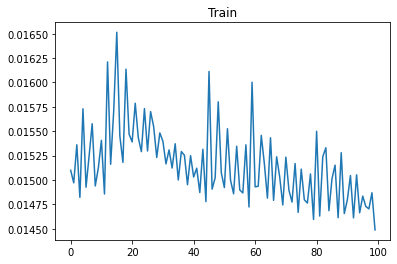

In [13]:
# plt.plot(tv_loss[-100:])
# plt.title("Test")
# plt.show()

plt.plot(loss_total_train_clean[-100:])
plt.title("Train")
plt.show()

True


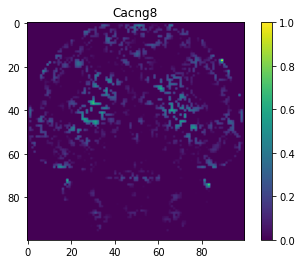

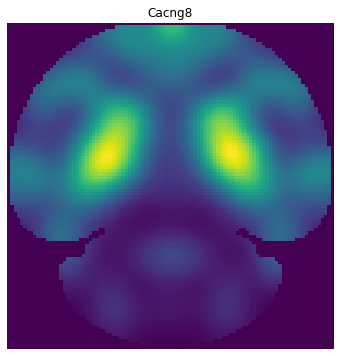

True


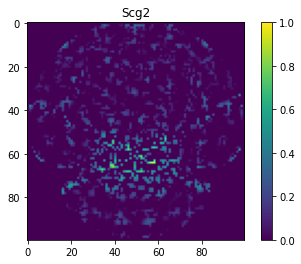

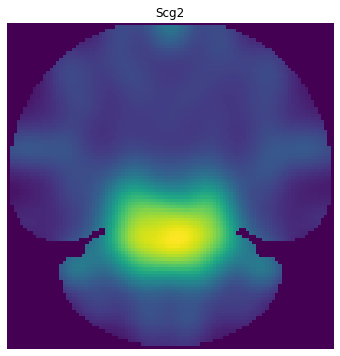

True


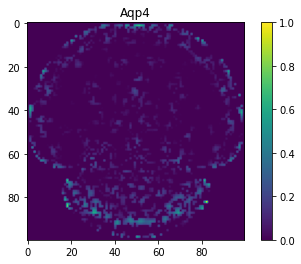

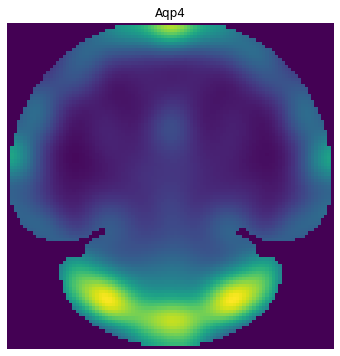

True


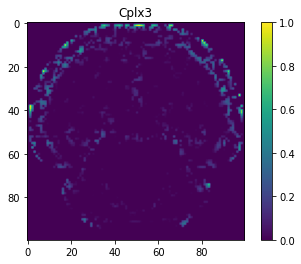

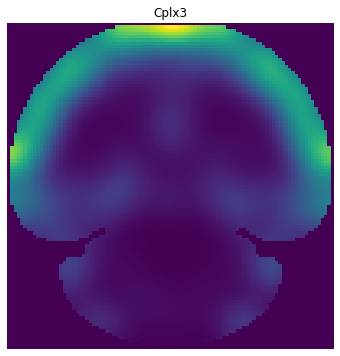

True


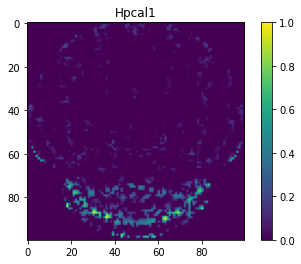

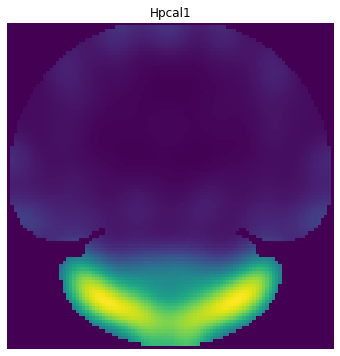

True


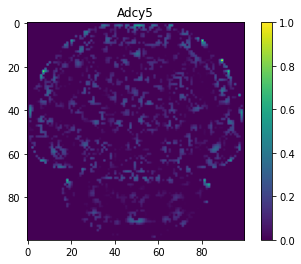

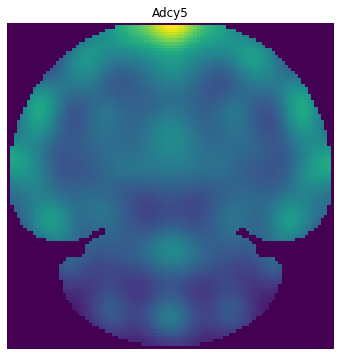

True


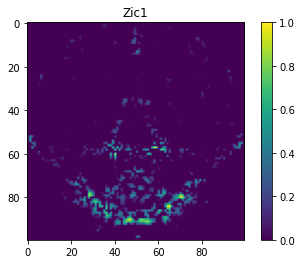

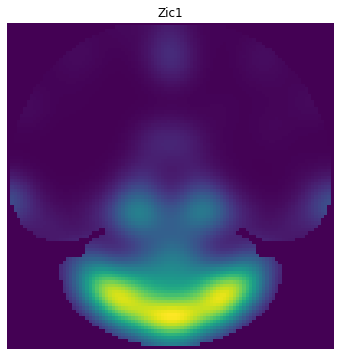

True


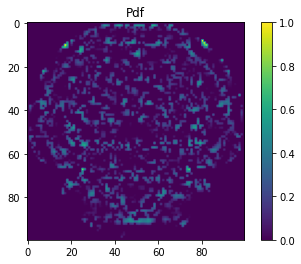

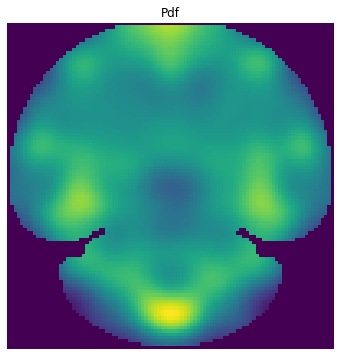

True


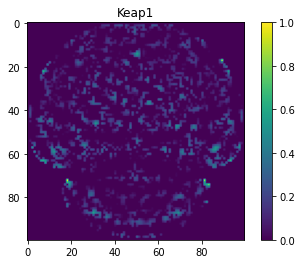

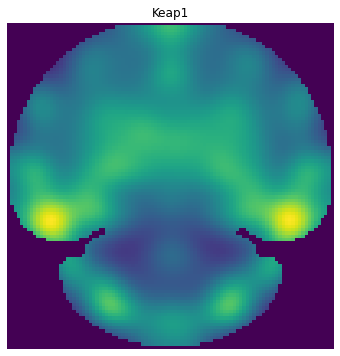

In [14]:
for gene_name in ["Cacng8","Scg2","Aqp4","Cplx3","Hpcal1","Adcy5","Zic1","Pdf","Keap1"]:
    index = np.where(angle_space_pd.index == gene_name)
    print(index[0].tolist()[0] in train_num.tolist())

    tmp_gene = model(data)[0].cpu().detach()[index,:].numpy()
    tmp_gene = (tmp_gene - tmp_gene.min())/(tmp_gene.max()+tmp_gene.min())

    image = plt.imshow(place_inside_mask(tmp_gene,mask_bw))
    plt.title(gene_name)
    plt.colorbar(image, orientation='vertical',)
    plt.show()
    
    
    blurred = gaussian_filter(place_inside_mask(tmp_gene,mask_bw), sigma=5,)
    plt.figure(figsize=(6, 6))
    plt.imshow(place_inside_mask(blurred.flat[:][mask_bw.flat[:].astype(bool)],mask_bw))
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.title(gene_name)
    plt.show()

##### 0-1标准化数据作为输入

findfont: Font family ['helvetica'] not found. Falling back to DejaVu Sans.


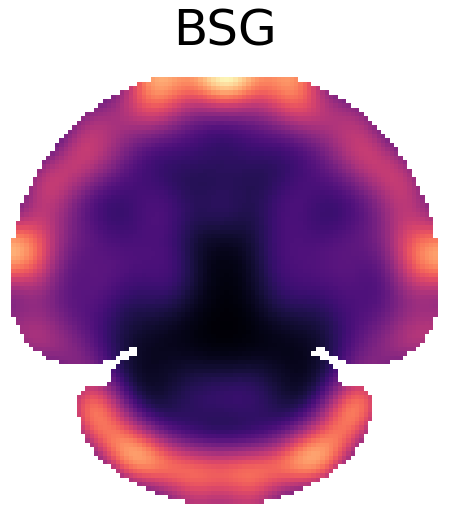

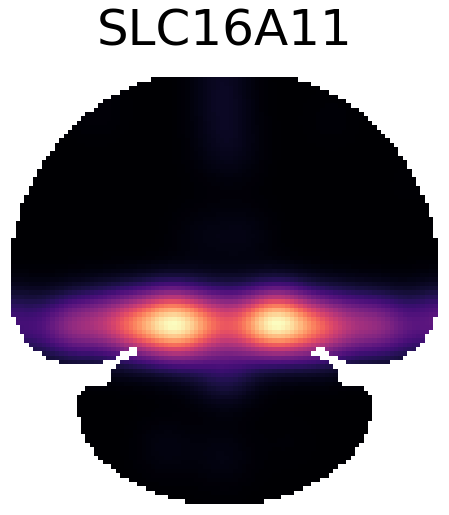

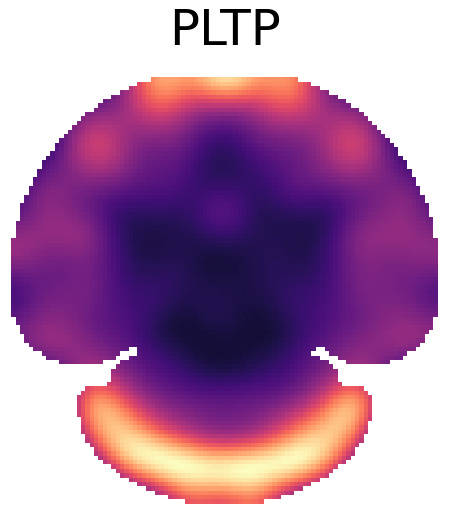

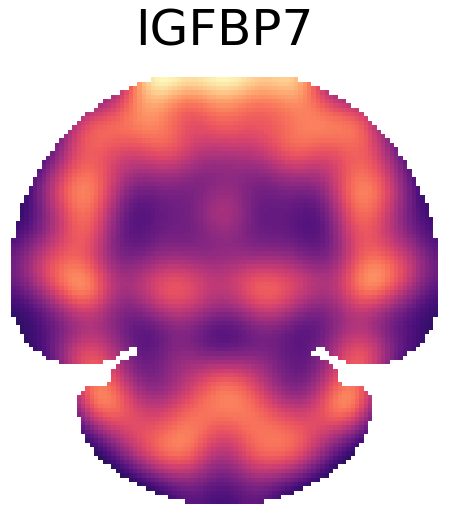

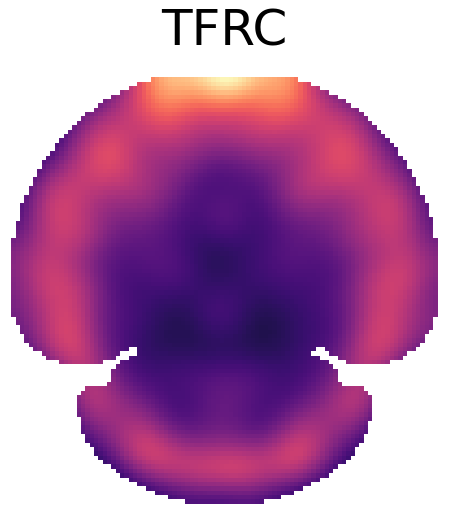

In [15]:
for gene_name in ["Bsg","Slc16a11","Pltp","Igfbp7","Tfrc"]:
    index = np.where(angle_space_pd.index == gene_name)
#     print(index[0].tolist()[0] in train_num.tolist())
    
    tmp_gene = model(data)[0].cpu().detach()[index,:].numpy()
    blurred = gaussian_filter(place_inside_mask(tmp_gene,mask_bw), sigma=5,)
    blurred = (blurred - blurred.min())/(blurred.max()+blurred.min())

    cmap = plt.cm.magma
    colored_image = cmap(place_inside_mask(blurred.flat[:][mask_bw.flat[:].astype(bool)],mask_bw),bytes=False)
# colored_image = (colored_image - colored_image.min())/(colored_image.max()+colored_image.min())
# plt.imshow(colored_image)
# plt.show()

    img = np.full([100,100,3],1, dtype = np.float64)
    img[:,:,2].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,2].flat[:][mask_bw.flat[:].astype(bool)]*1
    img[:,:,0].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,0].flat[:][mask_bw.flat[:].astype(bool)]*1
    img[:,:,1].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,1].flat[:][mask_bw.flat[:].astype(bool)]*1

    plt.figure(figsize=(8,8))
    image = plt.imshow(img,cmap=cmap)
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.title(gene_name.upper(),fontsize=50,y=1.05,fontname='helvetica')
#     plt.colorbar(image, orientation='vertical',)
    plt.show
    
#     figure_save_path = "./SaveFig/Reconstruction List/brain-seq database/endothelial"
#     if not os.path.exists(figure_save_path):
#         os.makedirs(figure_save_path)
#     plt.savefig(os.path.join(figure_save_path , gene_name+'.pdf'))
#     plt.show()


True


<function matplotlib.pyplot.show(close=None, block=None)>

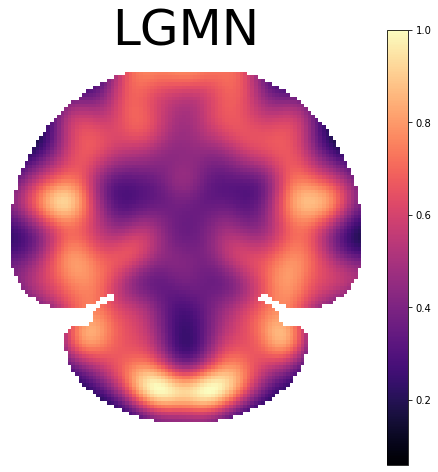

In [16]:
gene_name = "Lgmn"
index = np.where(angle_space_pd.index == gene_name)
print(index[0].tolist()[0] in train_num.tolist())

tmp_gene = model(data)[0].cpu().detach()[index,:].numpy()
blurred = gaussian_filter(place_inside_mask(tmp_gene,mask_bw), sigma=5,)
blurred = (blurred - blurred.min())/(blurred.max()+blurred.min())

cmap = plt.cm.magma
colored_image = cmap(place_inside_mask(blurred.flat[:][mask_bw.flat[:].astype(bool)],mask_bw),bytes=False)
# colored_image = (colored_image - colored_image.min())/(colored_image.max()+colored_image.min())
# plt.imshow(colored_image)
# plt.show()

img = np.full([100,100,3],1, dtype = np.float64)
img[:,:,2].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,2].flat[:][mask_bw.flat[:].astype(bool)]*1
img[:,:,0].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,0].flat[:][mask_bw.flat[:].astype(bool)]*1
img[:,:,1].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,1].flat[:][mask_bw.flat[:].astype(bool)]*1

plt.figure(figsize=(8,8))
image = plt.imshow(img,cmap=cmap)
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.title(gene_name.upper(),fontsize=50,y=1.05,fontname='helvetica')
plt.colorbar(image, orientation='vertical',)
plt.show


##### 原始表达(0-1标准化前)的数据作为输入

In [17]:
data2 = np.load("./Prepare_NN_Data/angle_space_SP_Add_2.npy")

data2 = data2[(data2 != 0).sum(1)>= 8,:]
data2 = data2[:-1,:]
dmax = data2.max(1)
dmin = data2.min(1)

True


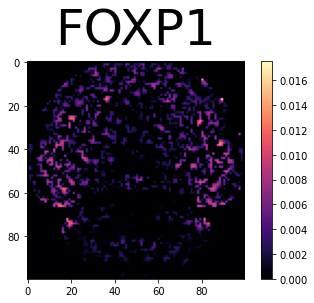

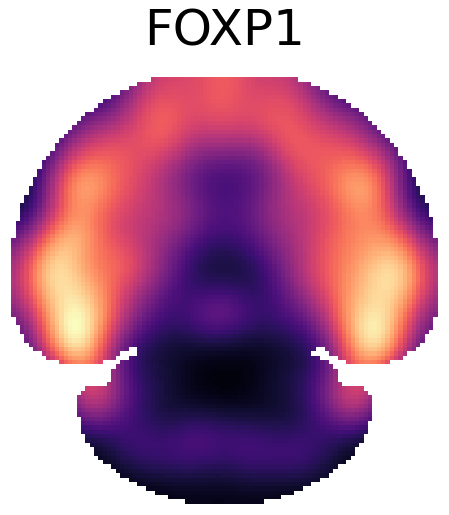

In [18]:
gene_name = "Foxp1"
index = np.where(angle_space_pd.index == gene_name)
print(index[0].tolist()[0] in train_num.tolist())

tmp_gene = data[index,:].squeeze(0)*(dmax[index].item()-dmin[index].item()) + dmin[index].item()
tmp_gene = model(tmp_gene)[0].cpu().detach().numpy()

image = plt.imshow(place_inside_mask(tmp_gene,mask_bw),cmap=cmap)
plt.title(gene_name.upper(),fontsize=50,y=1.05,fontname='helvetica')
plt.colorbar(image, orientation='vertical')
plt.show()

blurred = gaussian_filter(place_inside_mask(tmp_gene,mask_bw), sigma=5,)
blurred = (blurred - blurred.min())/(blurred.max()+blurred.min())

cmap = plt.cm.magma
colored_image = cmap(place_inside_mask(blurred.flat[:][mask_bw.flat[:].astype(bool)],mask_bw),bytes=False)
# colored_image = (colored_image - colored_image.min())/(colored_image.max()+colored_image.min())
# plt.imshow(colored_image)
# plt.show()

img = np.full([100,100,3],1, dtype = np.float64)
img[:,:,2].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,2].flat[:][mask_bw.flat[:].astype(bool)]*1
img[:,:,0].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,0].flat[:][mask_bw.flat[:].astype(bool)]*1
img[:,:,1].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,1].flat[:][mask_bw.flat[:].astype(bool)]*1

plt.figure(figsize=(8,8))
plt.imshow(img,cmap=cmap)
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.title(gene_name.upper(),fontsize=50,y=1.05,fontname='helvetica')
# plt.colorbar(image, orientation='vertical')
plt.show()

True


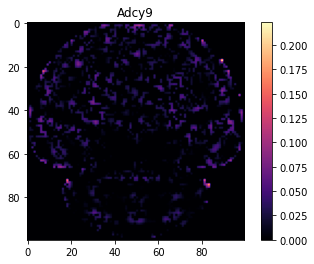

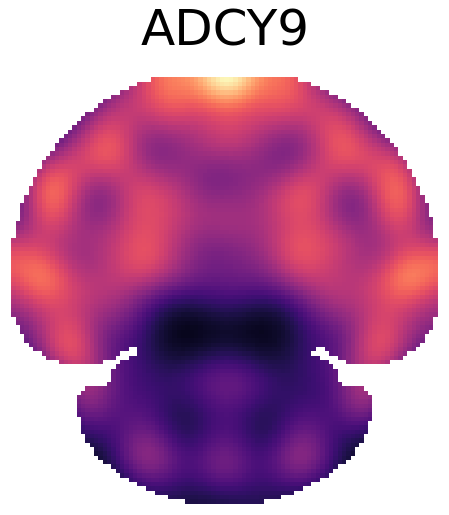

True


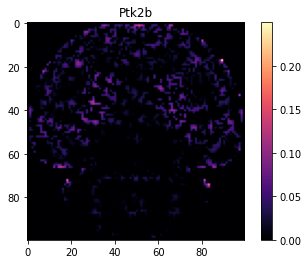

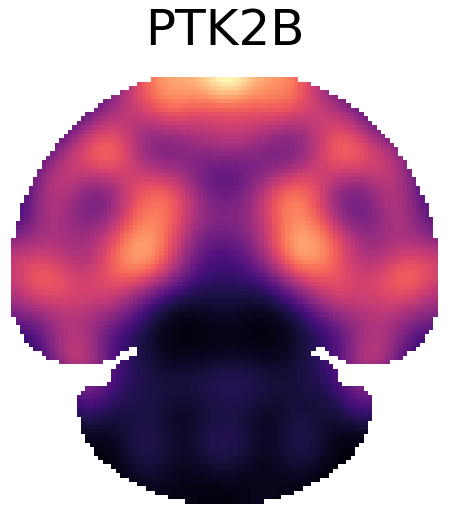

True


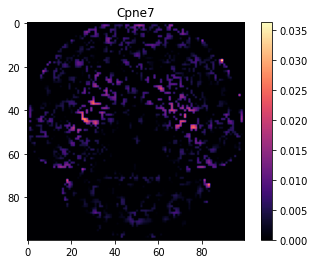

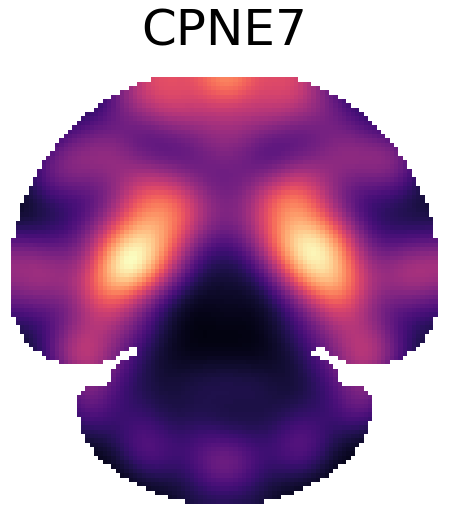

True


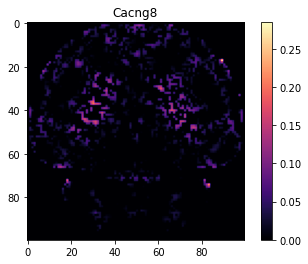

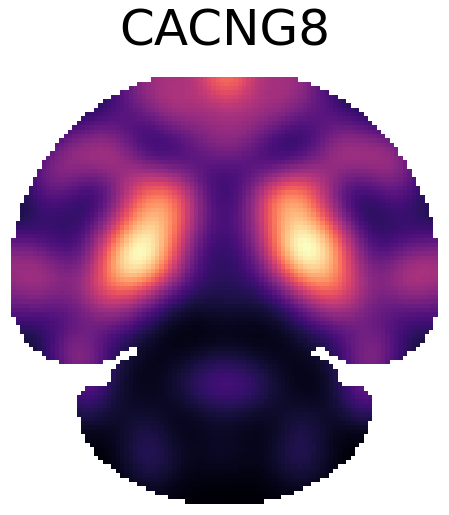

True


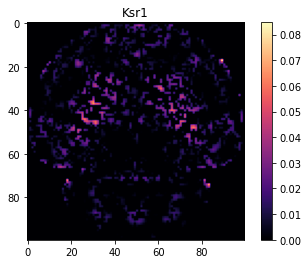

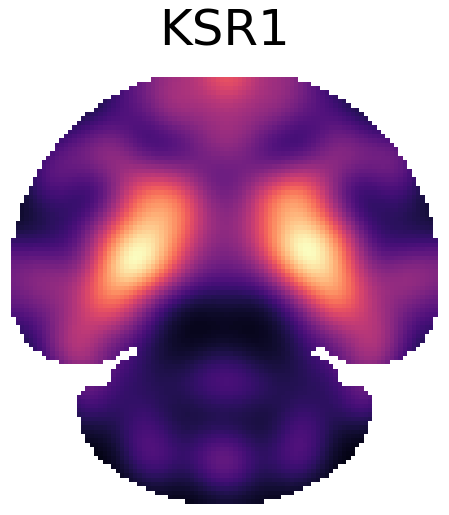

True


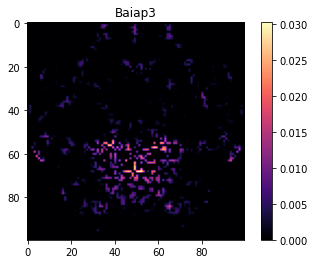

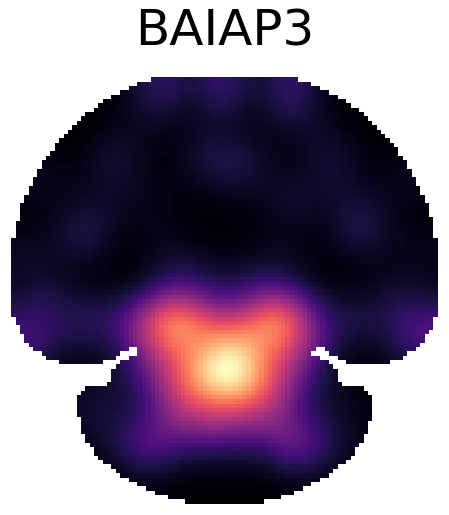

True


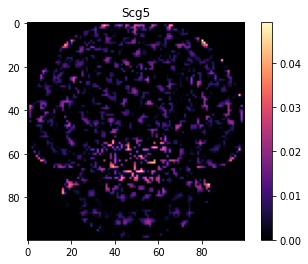

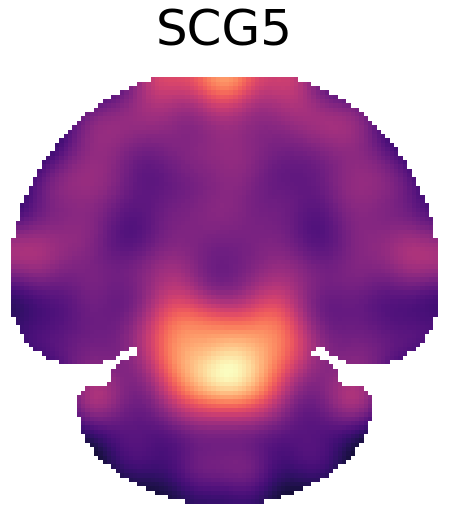

True


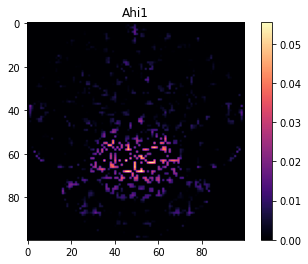

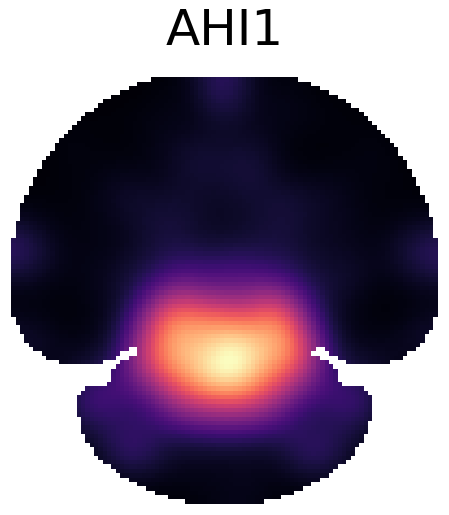

True


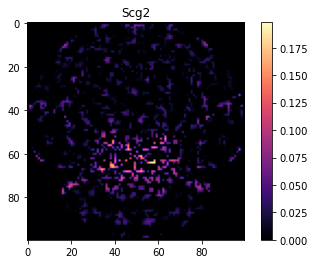

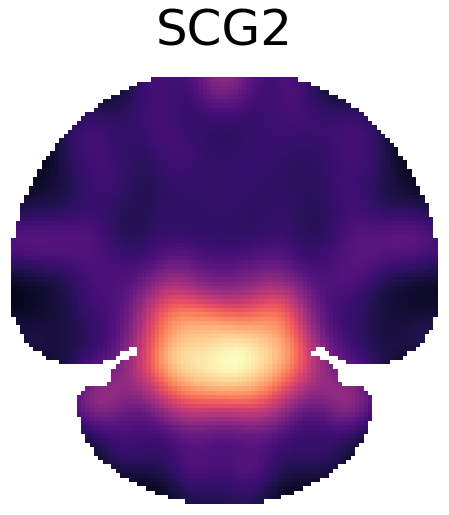

True


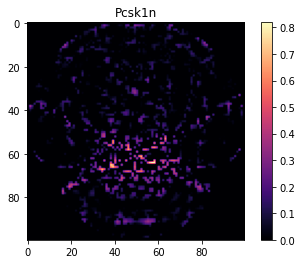

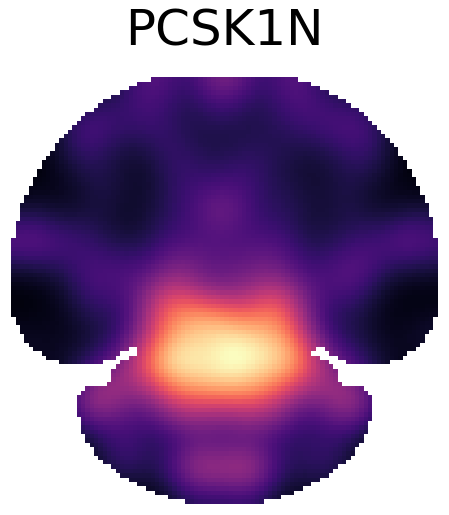

True


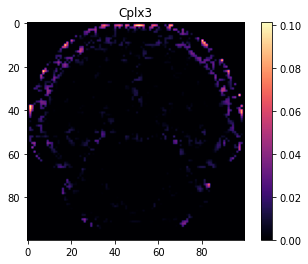

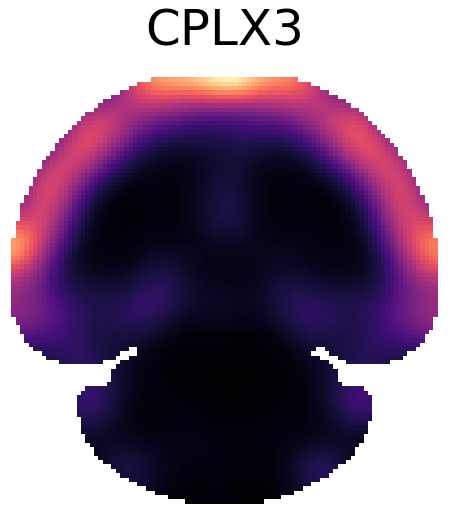

True


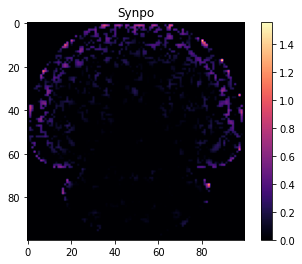

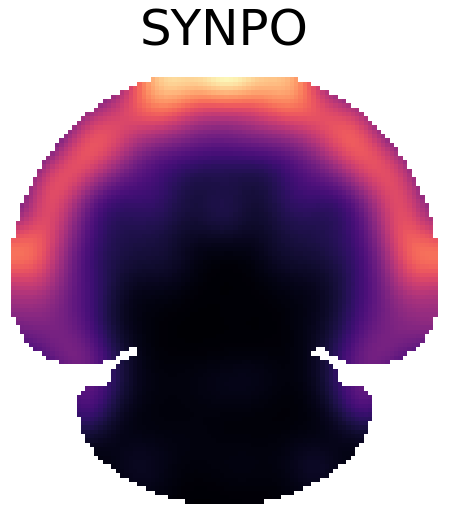

True


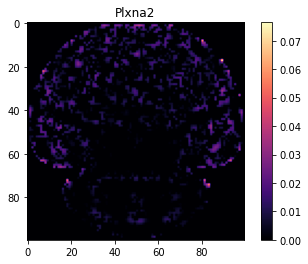

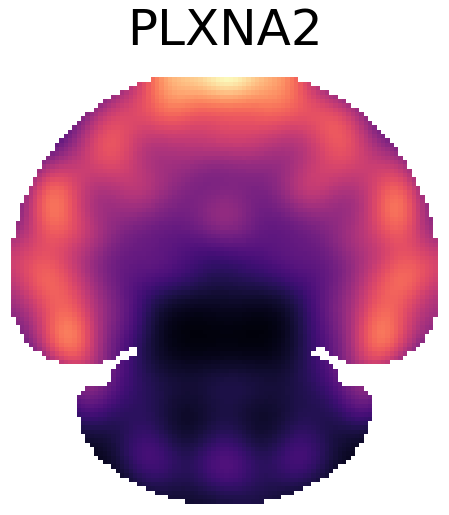

True


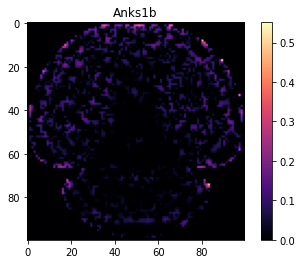

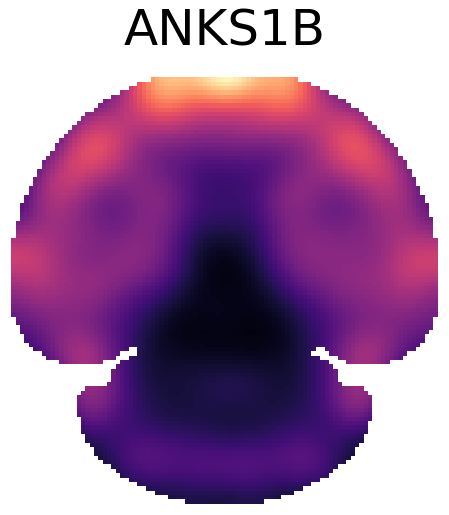

True


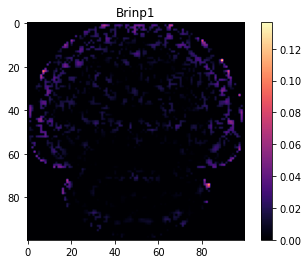

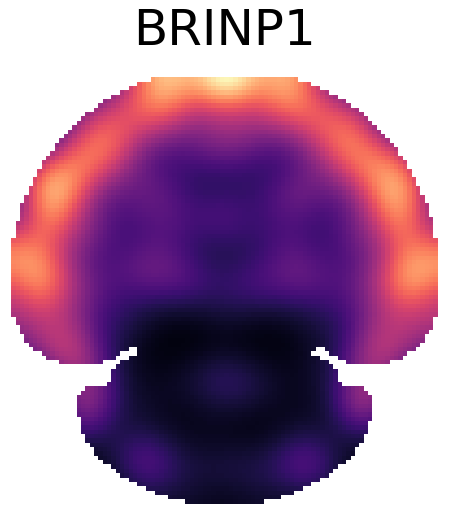

True


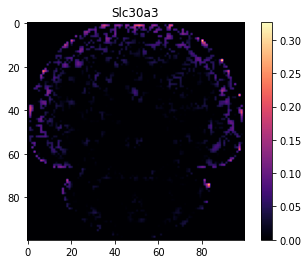

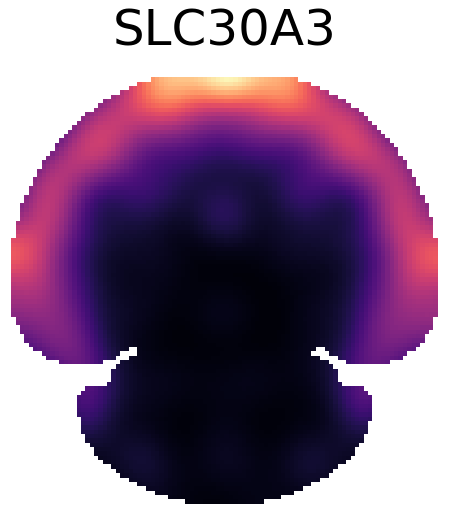

True


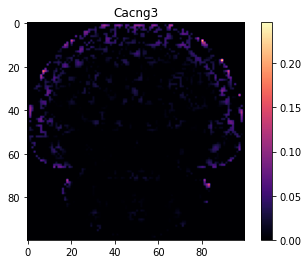

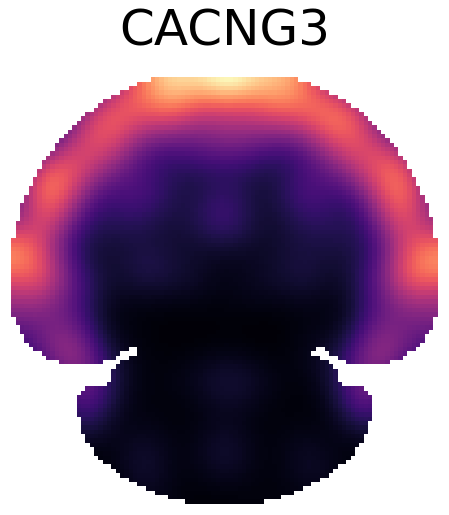

True


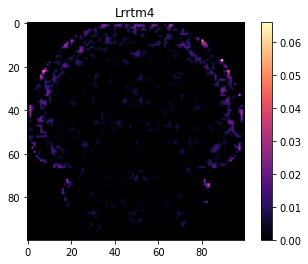

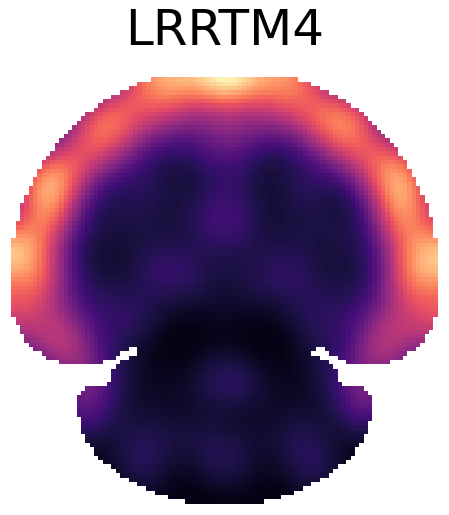

True


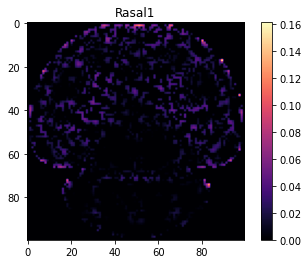

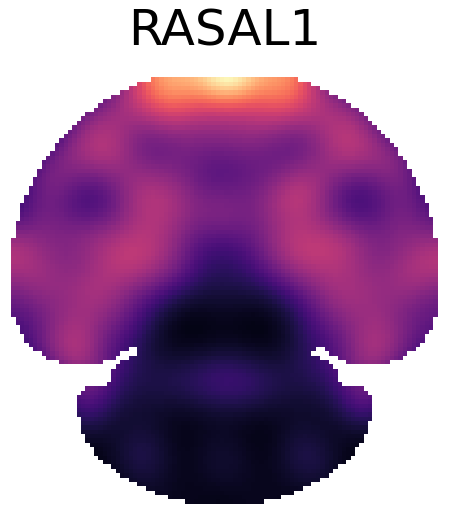

True


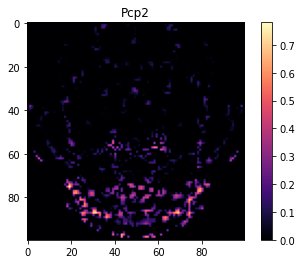

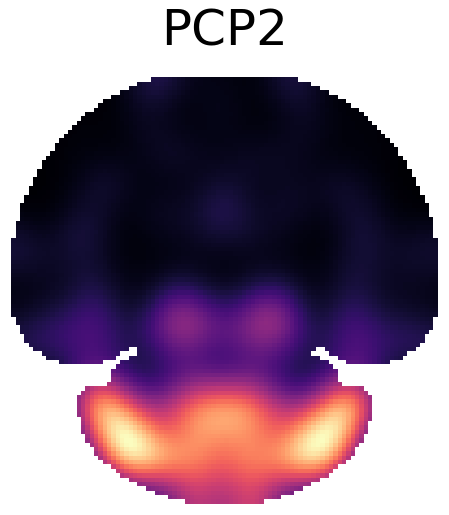

True


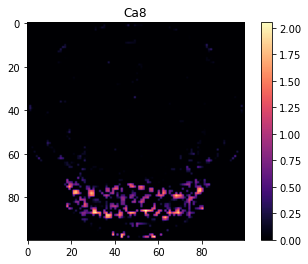

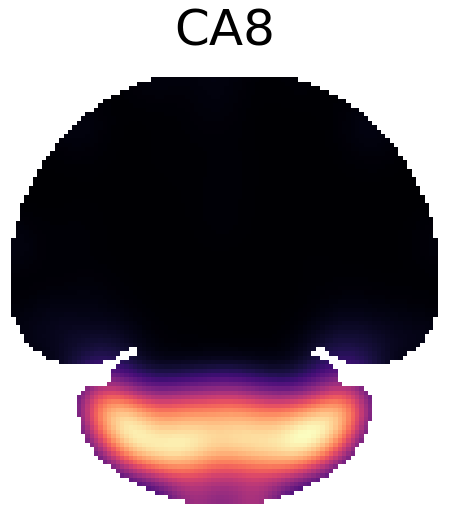

True


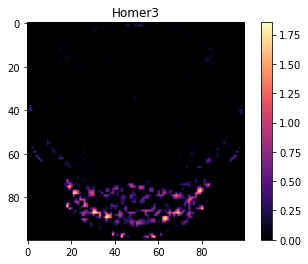

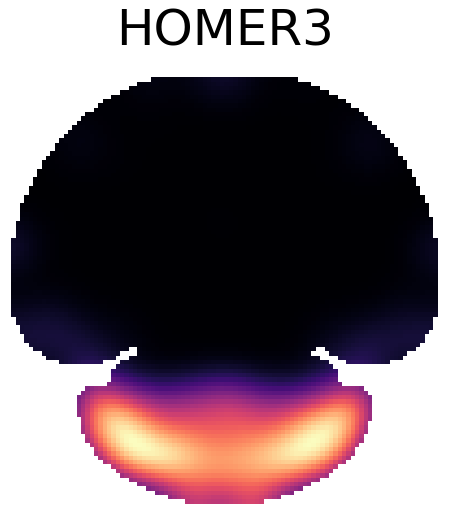

True


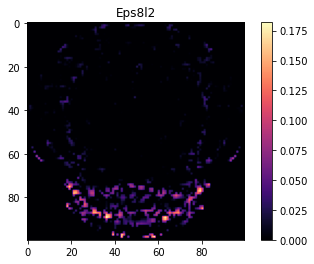

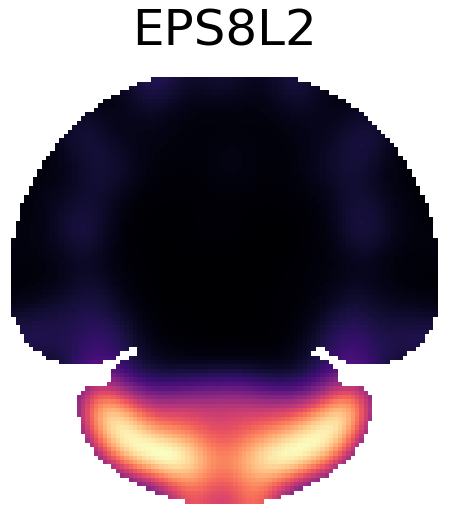

True


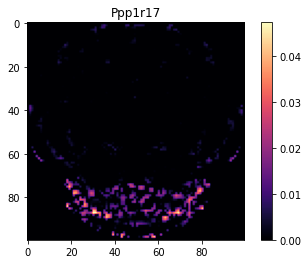

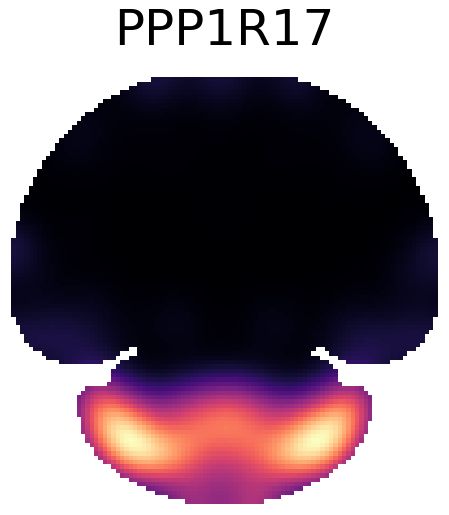

True


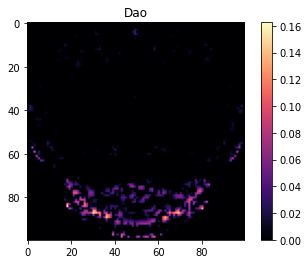

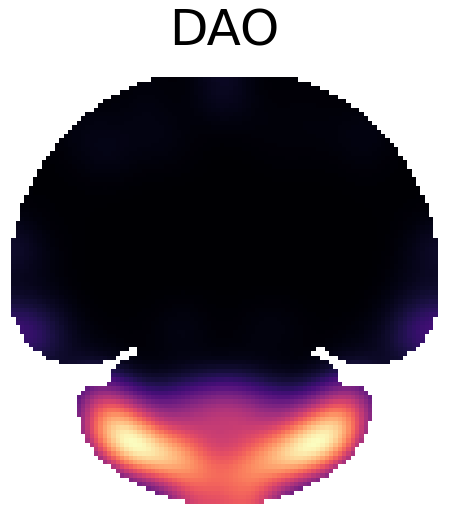

True


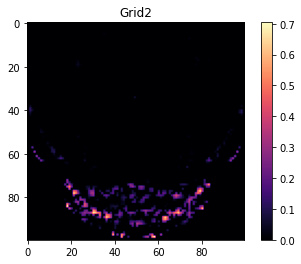

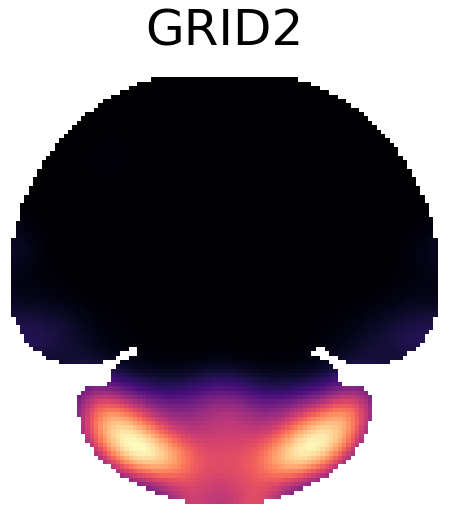

True


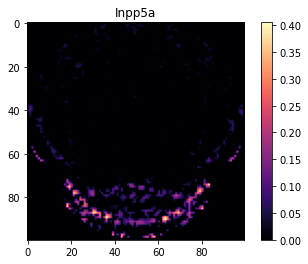

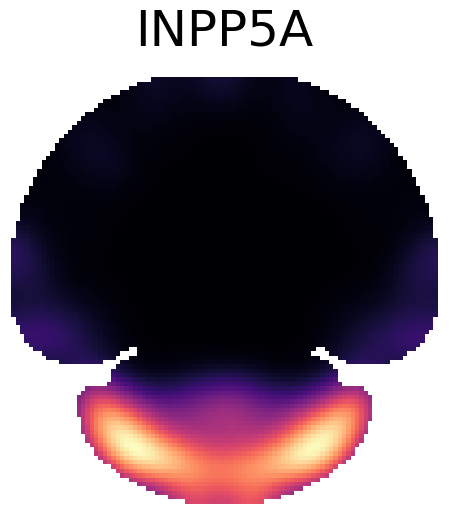

True


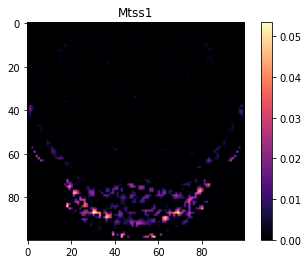

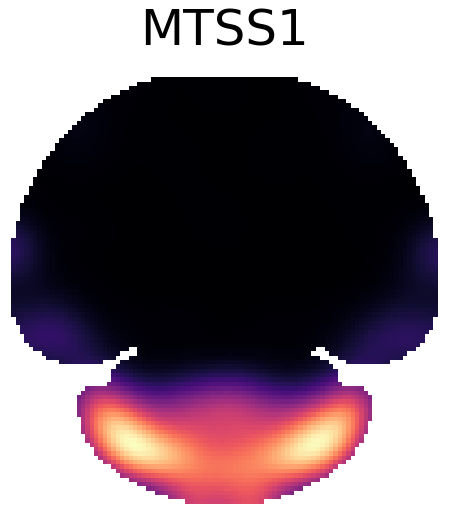

True


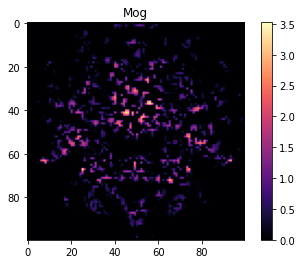

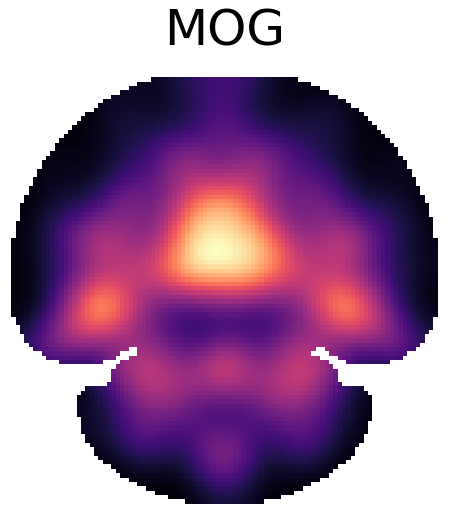

True


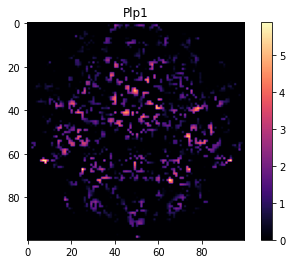

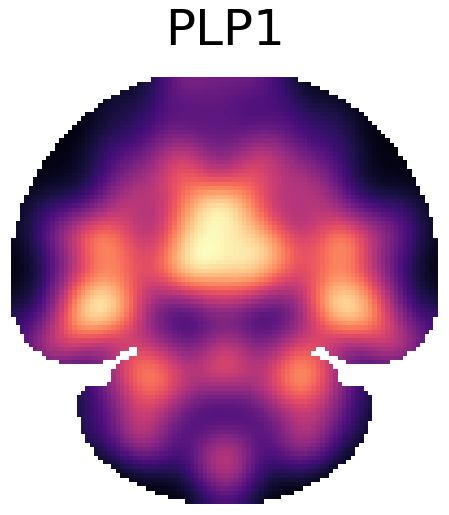

True


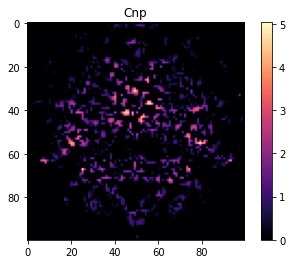

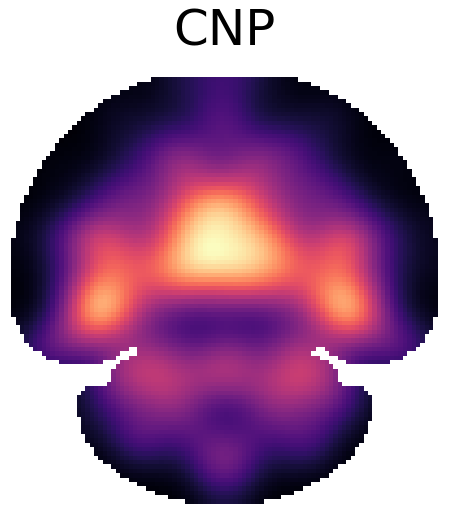

True


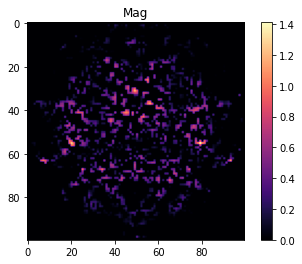

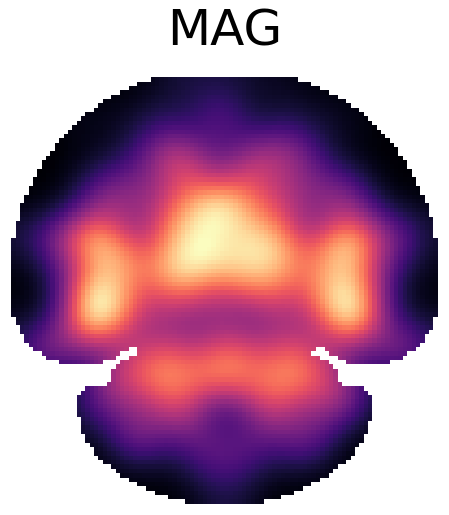

True


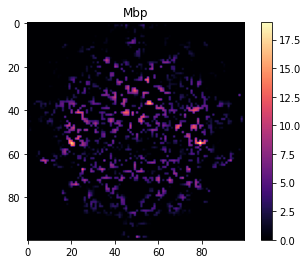

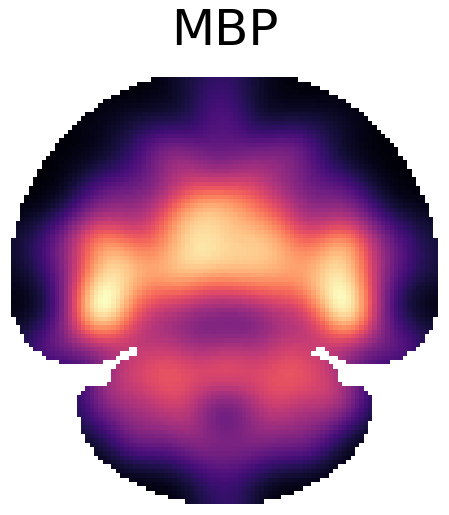

True


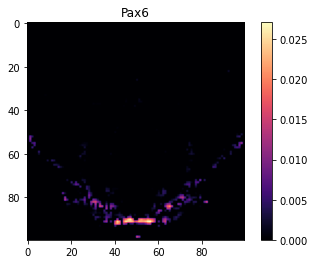

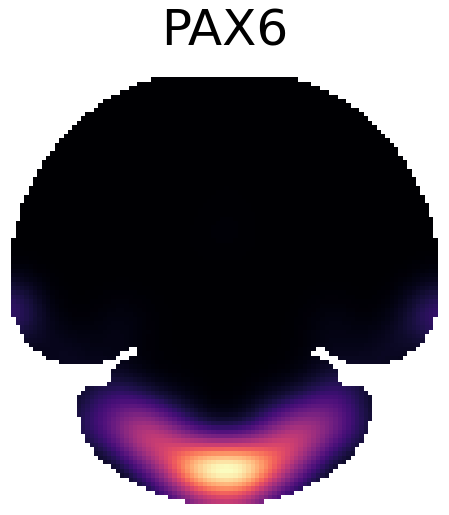

True


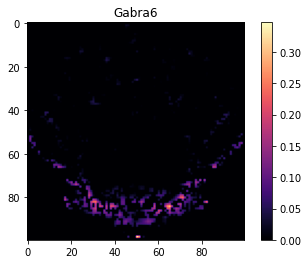

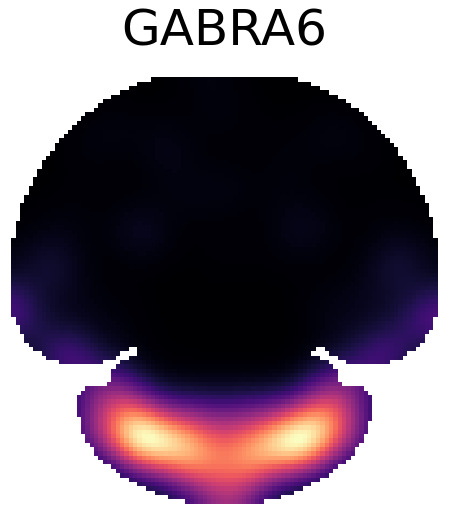

True


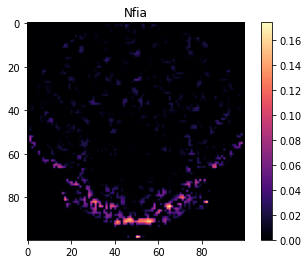

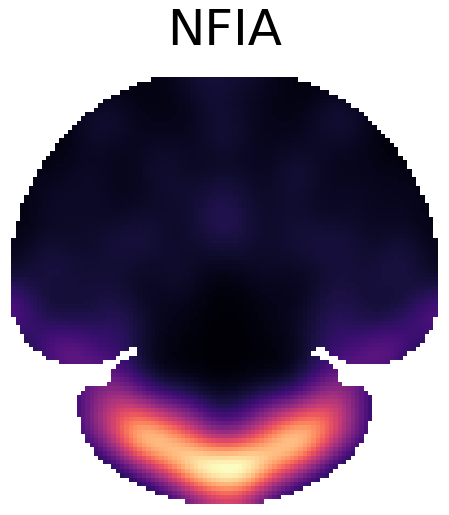

True


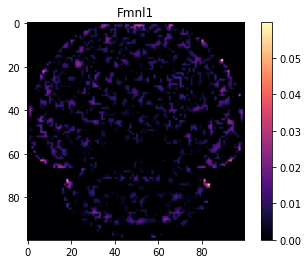

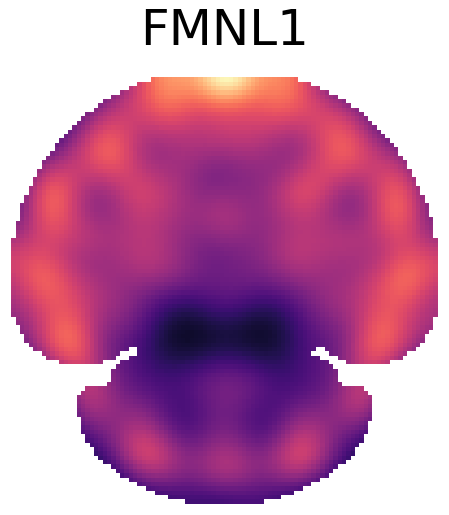

True


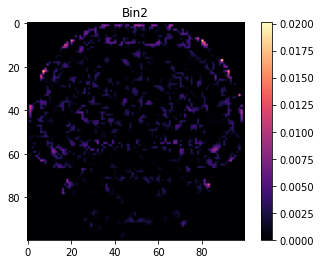

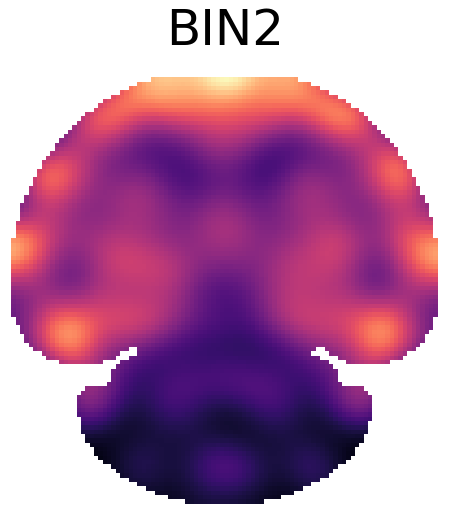

True


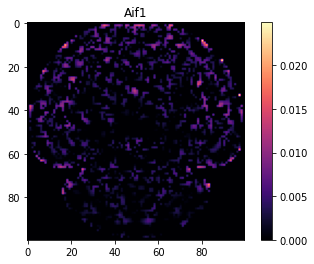

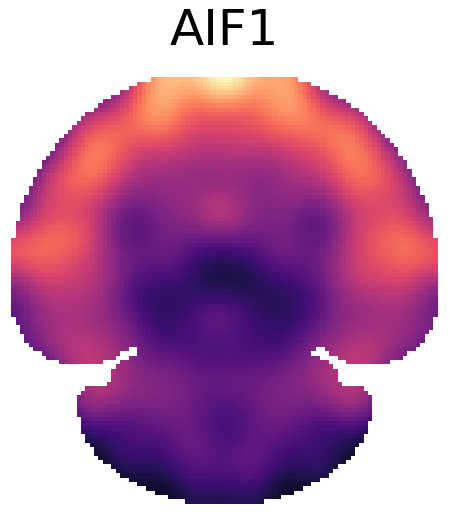

True


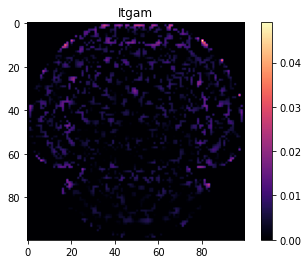

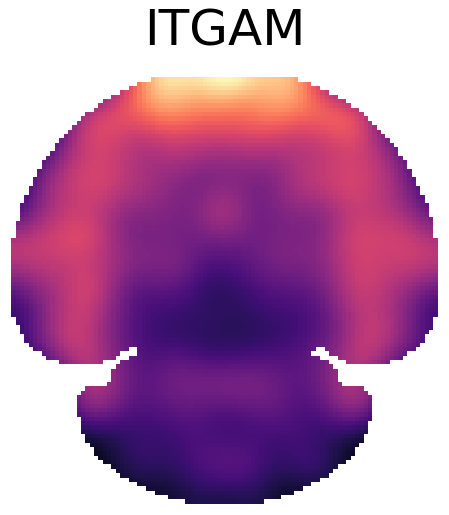

True


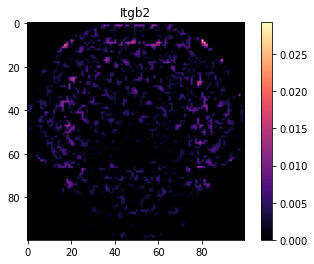

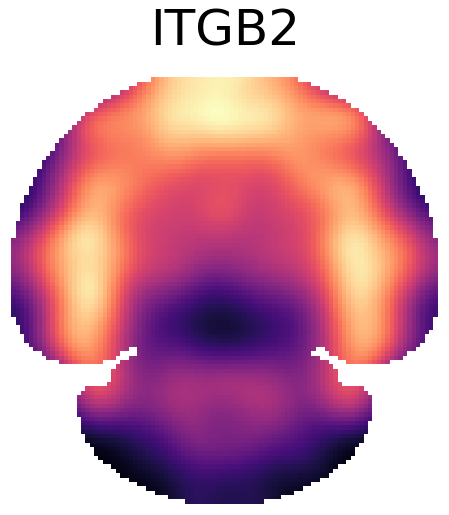

True


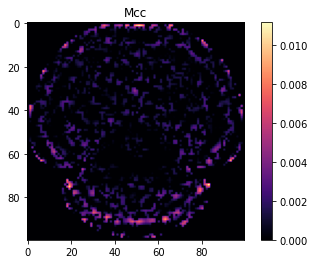

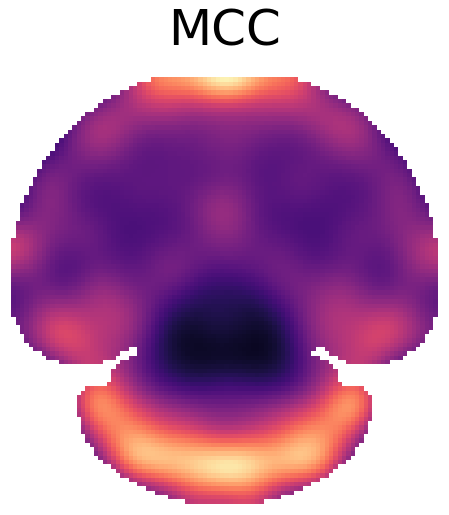

True


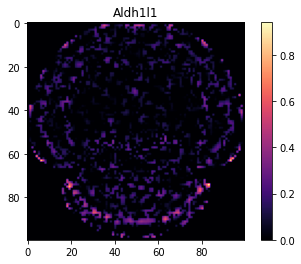

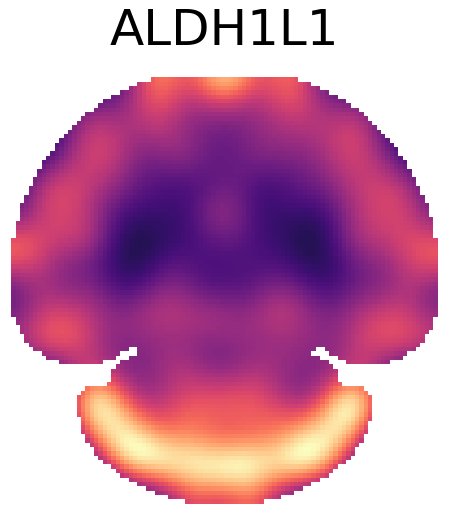

True


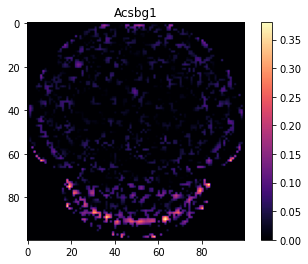

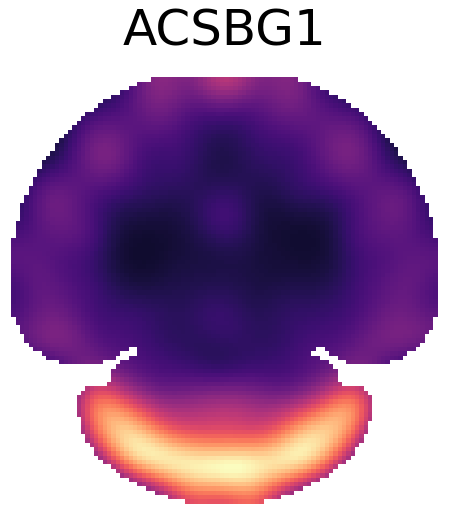

True


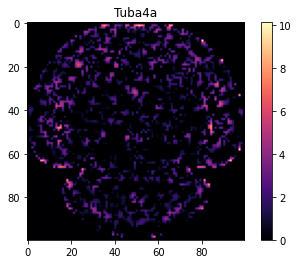

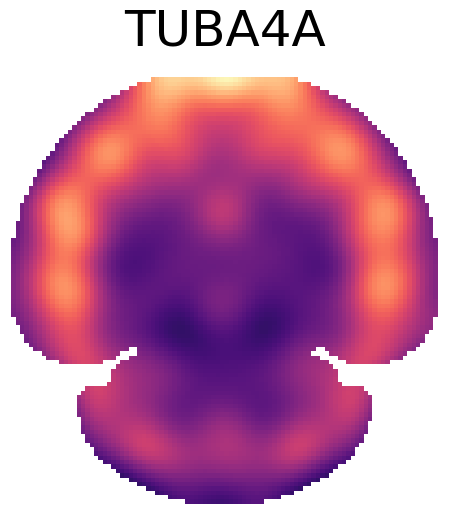

True


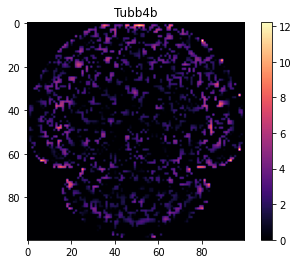

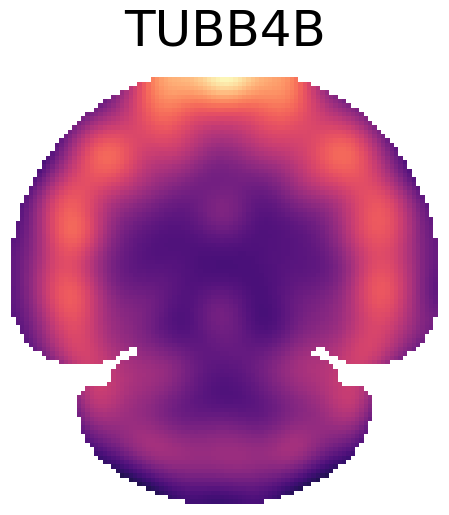

True


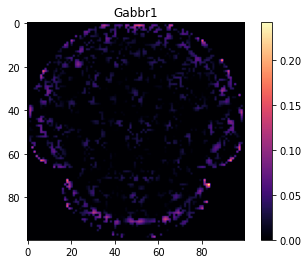

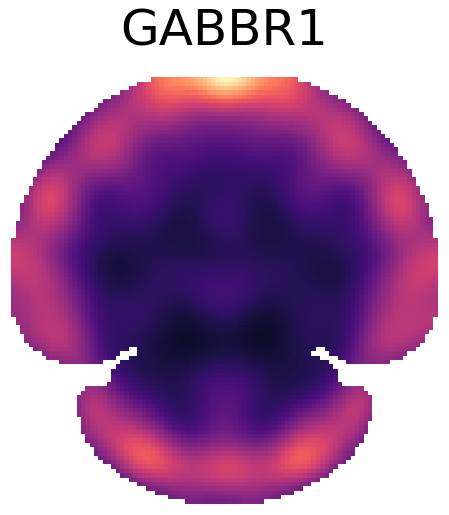

True


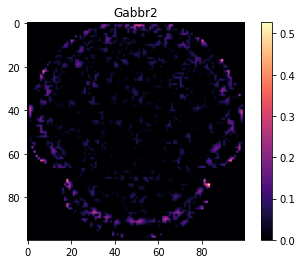

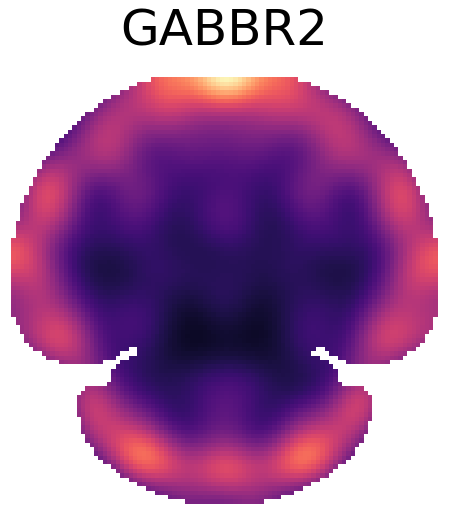

True


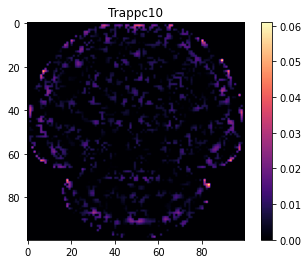

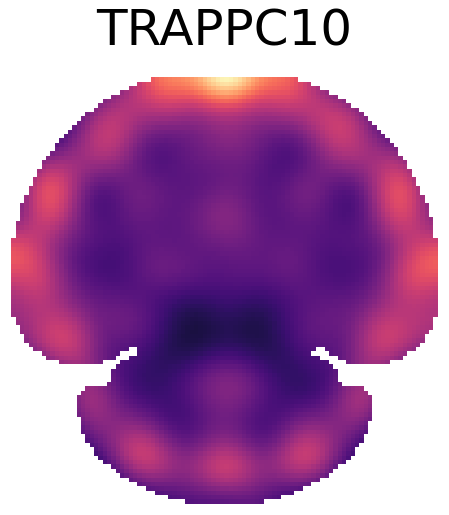

True


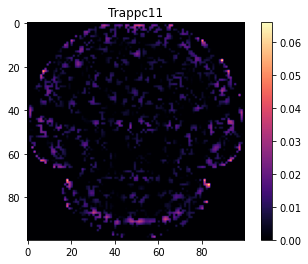

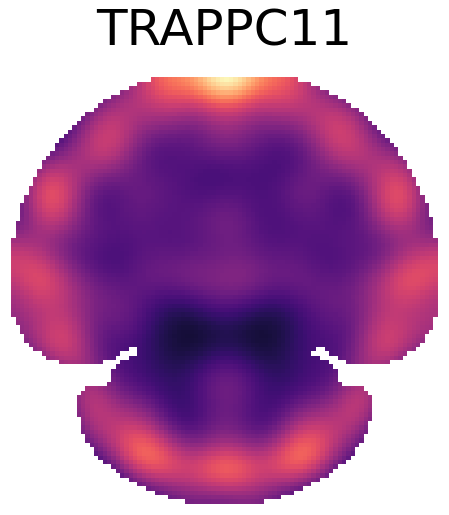

True


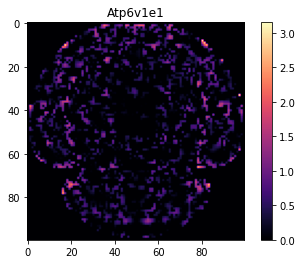

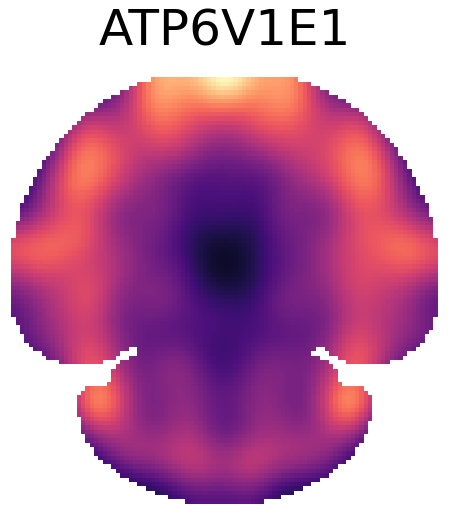

True


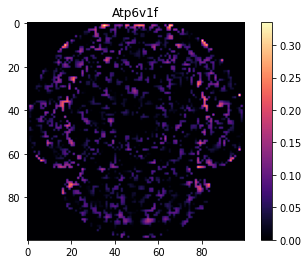

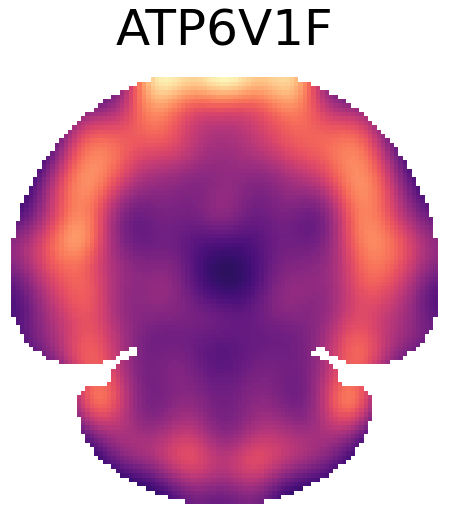

True


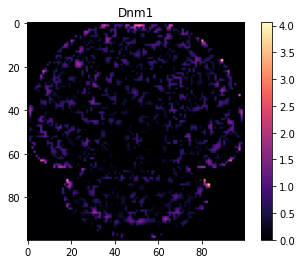

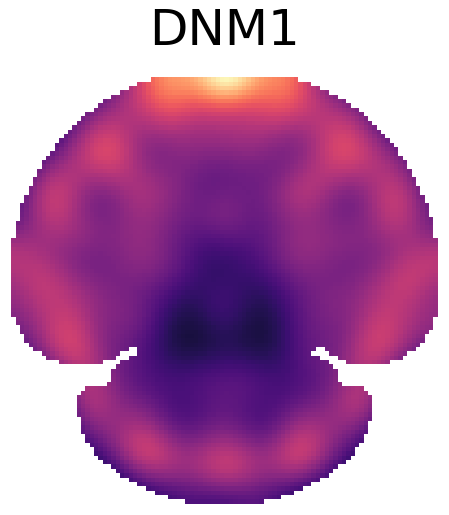

True


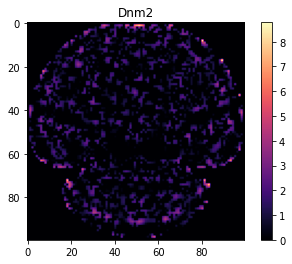

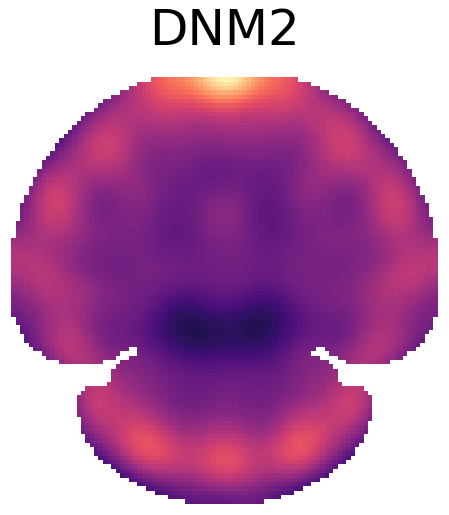

True


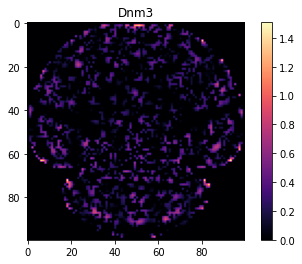

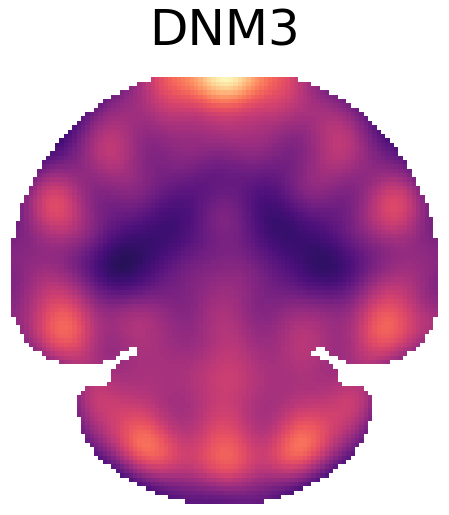

True


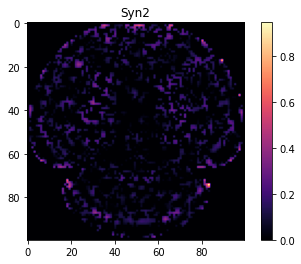

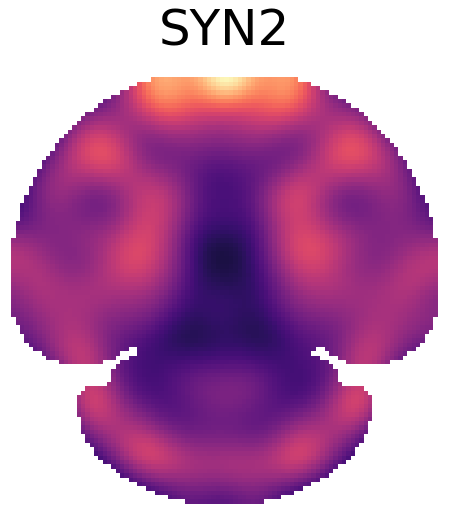

True


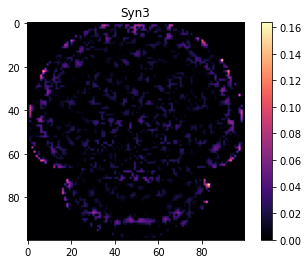

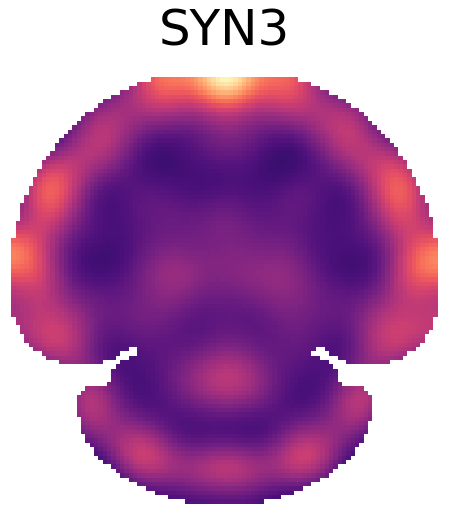

True


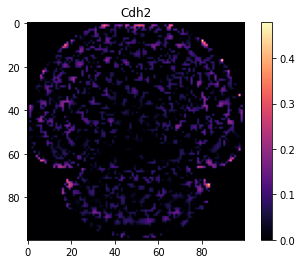

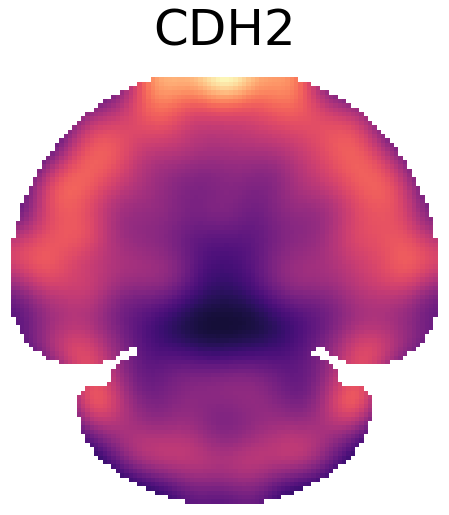

True


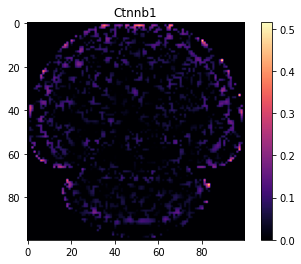

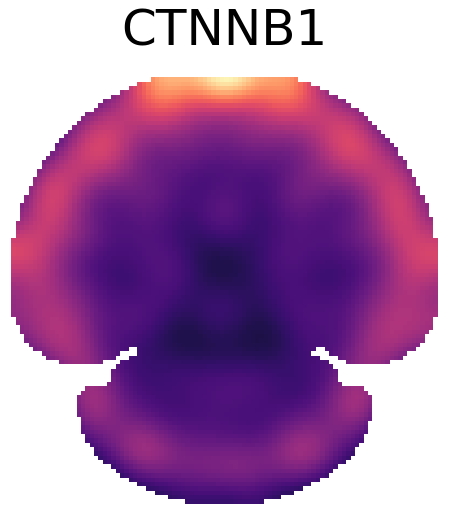

True


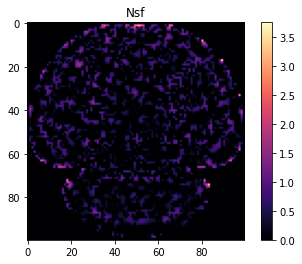

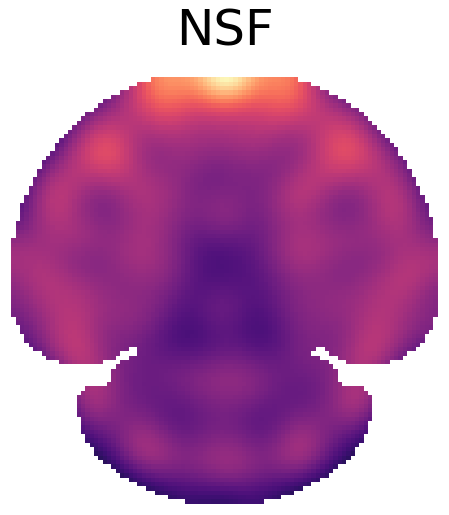

True


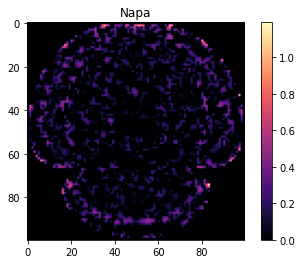

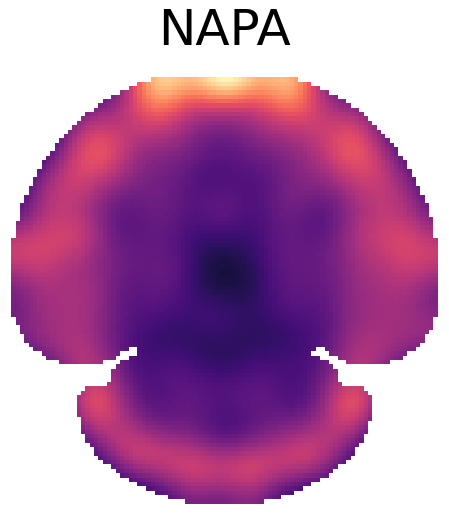

In [19]:
for gene_name in ["Adcy9","Ptk2b","Cpne7","Cacng8","Ksr1","Baiap3","Scg5","Ahi1","Scg2","Pcsk1n","Cplx3","Synpo","Plxna2","Anks1b","Brinp1","Slc30a3","Cacng3","Lrrtm4","Rasal1","Pcp2","Ca8","Homer3","Eps8l2","Ppp1r17","Dao","Grid2","Inpp5a","Mtss1","Mog","Plp1","Cnp","Mag","Mbp","Pax6","Gabra6","Nfia","Fmnl1","Bin2","Aif1","Itgam","Itgb2","Mcc","Aldh1l1","Acsbg1","Tuba4a","Tubb4b","Gabbr1","Gabbr2","Trappc10","Trappc11","Atp6v1e1","Atp6v1f","Dnm1","Dnm2","Dnm3","Syn2","Syn3","Cdh2","Ctnnb1","Nsf","Napa"]:
    index = np.where(angle_space_pd.index == gene_name)
    print(index[0].tolist()[0] in train_num.tolist())

    tmp_gene = data[index,:].squeeze(0)*(dmax[index].item()-dmin[index].item()) + dmin[index].item()
    tmp_gene = model(tmp_gene)[0].cpu().detach().numpy()

    image = plt.imshow(place_inside_mask(tmp_gene,mask_bw),cmap=cmap)
    plt.title(gene_name)
    plt.colorbar(image, orientation='vertical')
    plt.show()

    blurred = gaussian_filter(place_inside_mask(tmp_gene,mask_bw), sigma=5,)
    blurred = (blurred - blurred.min())/(blurred.max()+blurred.min())

    cmap = plt.cm.magma
    colored_image = cmap(place_inside_mask(blurred.flat[:][mask_bw.flat[:].astype(bool)],mask_bw),bytes=False)
    # colored_image = (colored_image - colored_image.min())/(colored_image.max()+colored_image.min())
    # plt.imshow(colored_image)
    # plt.show()

    img = np.full([100,100,3],1, dtype = np.float64)
    img[:,:,2].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,2].flat[:][mask_bw.flat[:].astype(bool)]*1
    img[:,:,0].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,0].flat[:][mask_bw.flat[:].astype(bool)]*1
    img[:,:,1].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,1].flat[:][mask_bw.flat[:].astype(bool)]*1

    plt.figure(figsize=(8,8))
    plt.imshow(img,cmap=cmap)
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.title(gene_name.upper(),fontsize=50,y=1.05,fontname='helvetica')
#     plt.colorbar(image, orientation='vertical',)
    plt.show()
    
#     figure_save_path = "./SaveFig/List1 proteins Intensity"
#     if not os.path.exists(figure_save_path):
#         os.makedirs(figure_save_path)
#     plt.savefig(os.path.join(figure_save_path , gene_name+'.pdf'))
#     plt.show()

##### 通路展示

37


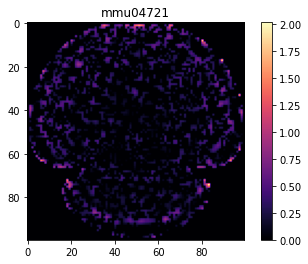

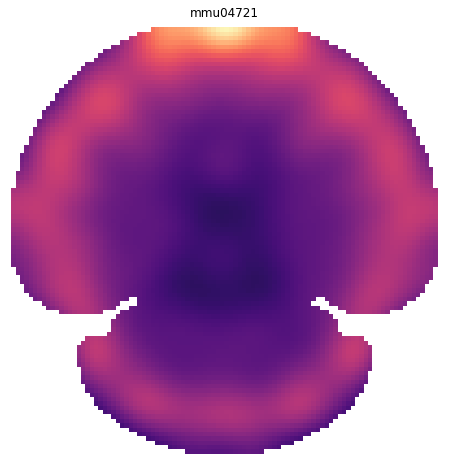

In [20]:
pathway_name = "mmu04721"
#gene_list = ["Araf","Pc","Grin1","Grin2a","Grin2b","Pnma8b","Oprd1","Adora1","Cnr1","Tmem181a","Tmem258","Mas1","Gosr1","Apoc3","Prune2","Lpar1","Cdk5","Eif1ax","Fmn2","Pold3","Nceh1","Pard3","Triqk","Grm5","Pds5b","Dctn4","Cenpc","Pgam1","Lacc1","Aifm2","Adra1b","Ubr4","Apoc1","Cfl1","Bmi1","Cryzl2","Ahsg","Ilvbl","Itgb8","Cln3","Serpinc1","Clock","Commd6","Cckbr","Chrm1","Chrm3","Drd1","Ankrd55","Phf3","Slc20a1","Ednrb","Grin2c","Cdc27","Grin2d","Grm1","Dnah12","Pcsk2","Hrh1","Rbm25","Cdh8","Htr2a","Prkcq","Afap1l1","Kcnj13","Sstr2","Fam91a1","Nccrp1","Hmgb2","Plekha2","Faap100","Sorl1","Oxtr","Gla","Ces1b","P2rx7","Rnaset2a","Zc3h3","Nmbr","Ctr9","Otud4","Clec3b","Als2cl","Spata2l","Fkbp4","Marchf5","Crat","Chrm5","Mlip","Brd9","Cables2","Chrm2","Khdrbs2","Eif4g2","Isg20l2","Sars2","Mpst","Sncb","Ssbp4","Adra2a","Med1","Egfr","Kng1","Unc80","Krit1","Npy","Adcyap1","Adrbk2","Sun2","Adcyap1r1","Wwc2","C4b","Crh","Crhr1","Bag1","Fcho2","Myd88","Epb41","Klhdc7a","Chuk","Aqp4","Hspa4l","C1qbp","Cpeb3","Gria1","Gria4","Map1s","Htr1a","Cep76","Ctsg","Nell2","Jup","Sfxn2","Dennd5b","Dst","Stxbp2","Npy1r","Endou","Oxt","Pea15","Sst","RO60","Cntnap4","Srgap3","Gnai1","Zbtb21","Vip","Tac1","Gabbr2","Trio","Ppp4r2","Gria3","Kdm5a","Gabbr1","Kif13a","Gh1","Fes","Id4","Gad2","Ilrun","Exoc7","Pecam1","Fam172a","Rbm34","Inpp5e","S1pr1","Tpbg","Tjp2","Ndufs6","S1pr5","Grm2","Grm3","Tmem215","Trappc1","Aqr","Grm7","Cdkl5","Avp","Strada","Prex2","Ctbp1","F2","Usp39","Grm8","Xpnpep3","Grm4","Eif4e2","Pet117","Raph1","Mtch2","Chmp6","Pde8b","Myo1e","Naip2","Cyp2j9","Klhdc9","Nup85","Qars1","Svip","Rab11fip2","Glra3","Pmch","Grik4","Mgat5","Krt80","Dok6","Frmd4a","Gabra5","Zfand2b","Glrx2","Prss1","Rab14","Chrna4","Srsf10","Sod2","Chrnb2","Inka2","Krt10","Fcer1g","Tdrd3","Npy2r","Zfp941","Niban1","Mafg","Fmod","C3","Slc25a26","Snap23","Igf1r","Cck","Rbm15","Chrm4","Usp5","Cpne7","Plcb3","Krt2","Ncan","Kifc2","Otof","Ddc","Mnt","Slmap","Gabra1","Gabra2","Pgm2l1","Gabra3","Gabra4","Gabra6","Gabrb1","Gabrb2","Gabrb3","1700009N14Rik","Gabrd","Gabrg1","Gabrg2","Rasgrf1","Sult1d1","Gal","Elp6","Galr3","Arhgdib","Gpr162","Ca3","Ssb","Glra1","Nsrp1","Glrb","Umps","Dipk2a","Nme2","Plin4","Nck2","Grid1","Grid2","Aftph","Grik5","Nr3c1","Trappc9","Sub1","Hcrt","Scg5","Mocs1","Dipk1b","Exph5","Notch1","Wars1","Myh2","Dync2h1","Papola","Znf800","Fkbp5","Nptx2","Eif2d","Ntsr2","Slc30a10","Rpusd3","Mmp13","Oprm1","Elapor2","Api5","Penk","Plg","P3h1","Alad","Tsc2","Pald1","Drg1","Msh2","Vwa8","Ube2r2","Esf1","Eps8","Smu1","Hmgcs1","Gm1673","Wdr33","Heatr5a","Rln3","Tekt4","Ctsk","Nkrf","Rhobtb2","IntS13","Rint1","Sorcs2","Rsph1","Drp2","Thra","Acvr1","Fstl1","S100a4","Mmp17","Irs2","Cpt1a","Tmem59l","Mgat5b","Lrp1","Grp","Ift172","Npbwr1","Hectd2","Wnk1","Sez6l2","Opa1","Dhx16","Grwd1","Tars2","Glra2","Sorbs2","Aloxe3","Nprl2","Zdhhc8","Atg4b","Lynx1","Mff","Afdn","Ccdc93","Cggbp1","Hddc2","Evi5l","Dstyk","Mpdu1","Slc39a12","Dock10","Dmxl2","Pcdh11x","Gnas","Vgf","Xkr4","Try10","Dhps","Pgrmc1","Calcrl","Tagln2","Cpsf3","Myadml2","Sacs","Nos1","Nrip3","Fezf2","Gpr89","Eloa","Mrpl10","Extl2","Ggct","2210010C04Rik","Nts","Atp6v1g1","Lyrm1","Paqr6","Tmem97","Calm1","Pgrmc2","Selenos","Oma1","Paqr9","Acbd7","Rnf214","Lyplal1","Cic","Hdac9","Slc30a9","Hrh3","Plcl1"]
#gene_list =["Nos1","Casp1","Nos3","Pdcd2l","Tafa5","Adcy3","Vps13b","Srebf2","Trappc14","Aff3","Strada","Adcy8","Adcy9","Pde1a","Sarm1","Pde1b","Pde1c","Heca","Adcy1","Slc36a1","Sbspon","Plcb1","Tbc1d8b","Plcb3","Plcd1","Plcd4","Plcg1","Itpka","Itpkc","Plcg2","Itpkb","Plcd3","Plce1","Sphk1","Spag9","Sphk2","Foxk2","Cd38","Shank3","Niban1","C4b","Senp3","Pacsin2","Calr4","Egfr","Slc7a3","Erbb3","Prune2","Gstm2","Sec16a","Pcsk2","Ppp6r1","Cbfb","Dido1","Ptpn12","Hspa5","Nmd3","Aimp1","Psmd7","Pdgfrb","Dscaml1","Prkca","Prkcb","Gpr162","Prkcg","Apoa1","Atad3","Ptn","Prkaca","Prkacb","Cxcr4","Camkv","Spg11","Cacna1a","Cacna1b","Cacna1c","Zc3h18","Cacna1d","Abca16","Ak4","Trim72","Col6a2","Erbb4","Fgf1","Syne1","Rabep1","Pmm1","Nap1l4","Cep76","Eif4e","Rbm3","Col19a1","Gpx1","Suco","Lmnb2","Btk","Acvr1","Wdtc1","Stom","Leng8","Fgfr1","Mark3","Dtymk","Ldlr","Coil","Amy1","Znhit6","Ntrk2","Ppp3ca","Ppp3cb","Ttc28","Ppp3cc","Ppp3r1","Krt35","Psma2","Scn1b","Cacna1i","Tmem59l","Sars2","Brms1l","Parva","Dusp10","Map3k20","Camk2d","Camk2a","Camk2b","Usp54","Camk2g","Cnih3","Ss18l1","Calm1","Grin1","Grin2a","Oprd1","Npr2","Drap1","Taf5l","Arpc3","Adora1","Mas1","Gnaq","Slc22a23","Phkb","Ppif","Triqk","Grm5","Pds5b","Palm3","Orai1","Phka2","Slc8a2","Slc8a3","Sorbs2","Iffo1","Dctn4","Cenpc","Pgam1","Lacc1","Aifm2","Adra1b","Apoc1","Cfl1","Bmi1","Cryzl2","Ahsg","Ilvbl","Stim2","Ttll7","Slc25a4","Slc25a5","Atp2a1","Stxbp5l","Atp2a2","Atp2b2","Dennd11","Aak1","Itgb8","Cln3","Serpinc1","Lrrc8d","Trim9","Sod3","Bckdhb","Casq2","Clock","Commd6","Cckbr","Chrm1","Chrm3","Drd1","Ankrd55","Phf3","Slc20a1","Ednrb","Elane","Gna11","Mfsd6","Dock2","Gna14","Ica1l","Gnal","Grin2c","Grin2d","Grm1","Dnah12","Fkbp1a","Rnpc3","Opcml","Slc25a15","Hrh1","Rbm25","Cdh8","Htr2a","Prkcq","Afap1l1","Kcnj13","Sstr2","Fam91a1","Nccrp1","Med12l","Uba3","Pdp1","Itpr1","Emc1","Itpr2","Ppwd1","Itpr3","Hmgb2","Plekha2","Purg","Marchf5","Ntrk3","Fam172a","Sorl1","Oxtr","Gla","Ces1b","P2rx7","Rnaset2a","Zc3h3","Nmbr","Phka1","Phkg1","Nol4","Ctr9","Clec3b","Als2cl","Spata2l","Olfr618","Ttll12","Ptk2b","Ret","Snrpa","Ryr1","Spag1","Ppp1r1b","Ryr2","Slc8a1","Galk2","Sipa1l3","Stim1","Fkbp4","Crat","Rnf10","Chrm5","Mlip","Camk1g","Mcu","Tnnc1","Fcer1g","Vdac1","Vdac2","Vdac3","Trmt1","Brd9","Abhd14b","Cables2","Steap2","Chrm2","Tpcn1","Khdrbs2","Myom2","Orai2","Orai3","Arhgef10","Atp2b4","Lrrc55","Camk1","Bbs4","Atp2a3","Cacul1","Cmpk2","Ddb1","Eif4g2","Isg20l2","Mpst","Asph","Atp2b1","Sf3a1","Phkg2","Sncb","Slc25a31","Rabl2","Smim11","Araf","Pc","Grin1","Grin2a","Grin2b","Pnma8b","Oprd1","Adora1","Cnr1","Tmem181a","Tmem258","Mas1","Gosr1","Apoc3","Prune2","Lpar1","Cdk5","Eif1ax","Fmn2","Pold3","Nceh1","Pard3","Triqk","Grm5","Pds5b","Dctn4","Cenpc","Pgam1","Lacc1","Aifm2","Adra1b","Ubr4","Apoc1","Cfl1","Bmi1","Cryzl2","Ahsg","Ilvbl","Itgb8","Cln3","Serpinc1","Clock","Commd6","Cckbr","Chrm1","Chrm3","Drd1","Ankrd55","Phf3","Slc20a1","Ednrb","Grin2c","Cdc27","Grin2d","Grm1","Dnah12","Pcsk2","Hrh1","Rbm25","Cdh8","Htr2a","Prkcq","Afap1l1","Kcnj13","Sstr2","Fam91a1","Nccrp1","Hmgb2","Plekha2","Faap100","Sorl1","Oxtr","Gla","Ces1b","P2rx7","Rnaset2a","Zc3h3","Nmbr","Ctr9","Otud4","Clec3b","Als2cl","Spata2l","Fkbp4","Marchf5","Crat","Chrm5","Mlip","Brd9","Cables2","Chrm2","Khdrbs2","Eif4g2","Isg20l2","Sars2","Mpst","Sncb","Ssbp4","Adra2a","Med1","Egfr","Kng1","Unc80","Krit1","Npy","Adcyap1","Adrbk2","Sun2","Adcyap1r1","Wwc2","C4b","Crh","Crhr1","Bag1","Fcho2","Myd88","Epb41","Klhdc7a","Chuk","Aqp4","Hspa4l","C1qbp","Cpeb3","Gria1","Gria4","Map1s","Htr1a","Cep76","Ctsg","Nell2","Jup","Sfxn2","Dennd5b","Dst","Stxbp2","Npy1r","Endou","Oxt","Pea15","Sst","RO60","Cntnap4","Srgap3","Gnai1","Zbtb21","Vip","Tac1","Gabbr2","Trio","Ppp4r2","Gria3","Kdm5a","Gabbr1","Kif13a","Gh1","Fes","Id4","Gad2","Ilrun","Exoc7","Pecam1","Fam172a","Rbm34","Inpp5e","S1pr1","Tpbg","Tjp2","Ndufs6","S1pr5","Grm2","Grm3","Tmem215","Trappc1","Aqr","Grm7","Cdkl5","Avp","Strada","Prex2","Ctbp1","F2","Usp39","Grm8","Xpnpep3","Grm4","Eif4e2","Pet117","Raph1","Mtch2","Chmp6","Pde8b","Myo1e","Naip2","Cyp2j9","Klhdc9","Nup85","Qars1","Svip","Rab11fip2","Glra3","Pmch","Grik4","Mgat5","Krt80","Dok6","Frmd4a","Gabra5","Zfand2b","Glrx2","Prss1","Rab14","Chrna4","Srsf10","Sod2","Chrnb2","Inka2","Krt10","Fcer1g","Tdrd3","Npy2r","Zfp941","Niban1","Mafg","Fmod","C3","Slc25a26","Snap23","Igf1r","Cck","Rbm15","Chrm4","Usp5","Cpne7","Plcb3","Krt2","Ncan","Kifc2","Otof","Ddc","Mnt","Slmap","Gabra1","Gabra2","Pgm2l1","Gabra3","Gabra4","Gabra6","Gabrb1","Gabrb2","Gabrb3","1700009N14Rik","Gabrd","Gabrg1","Gabrg2","Rasgrf1","Sult1d1","Gal","Elp6","Galr3","Arhgdib","Gpr162","Ca3","Ssb","Glra1","Nsrp1","Glrb","Umps","Dipk2a","Nme2","Plin4","Nck2","Grid1","Grid2","Aftph","Grik5","Nr3c1","Trappc9","Sub1","Hcrt","Scg5","Mocs1","Dipk1b","Exph5","Notch1","Wars1","Myh2","Dync2h1","Papola","Znf800","Fkbp5","Nptx2","Eif2d","Ntsr2","Slc30a10","Rpusd3","Mmp13","Oprm1","Elapor2","Api5","Penk","Plg","P3h1","Alad","Tsc2","Pald1","Drg1","Msh2","Vwa8","Ube2r2","Esf1","Eps8","Smu1","Hmgcs1","Gm1673","Wdr33","Heatr5a","Rln3","Tekt4","Ctsk","Nkrf","Rhobtb2","IntS13","Rint1","Sorcs2","Rsph1","Drp2","Thra","Acvr1","Fstl1","S100a4","Mmp17","Irs2","Cpt1a","Tmem59l","Mgat5b","Lrp1","Grp","Ift172","Npbwr1","Hectd2","Wnk1","Sez6l2","Opa1","Dhx16","Grwd1","Tars2","Glra2","Sorbs2","Aloxe3","Nprl2","Zdhhc8","Atg4b","Lynx1","Mff","Afdn","Ccdc93","Cggbp1","Hddc2","Evi5l","Dstyk","Mpdu1","Slc39a12","Dock10","Dmxl2","Pcdh11x","Gnas","Vgf","Xkr4","Try10","Dhps","Pgrmc1","Calcrl","Tagln2","Cpsf3","Myadml2","Sacs","Nos1","Nrip3","Fezf2","Gpr89","Eloa","Mrpl10","Extl2","Ggct","2210010C04Rik","Nts","Atp6v1g1","Lyrm1","Paqr6","Tmem97","Calm1","Pgrmc2","Selenos","Oma1","Paqr9","Acbd7","Rnf214","Lyplal1","Cic","Hdac9","Slc30a9","Hrh3","Plcl1"]
#gene_list = ["Atp1b2","Lrch2","Rph3a","Atxn1l","Ildr2","Clu","Retsat","Kctd8","Braf","Raf1","Akt1","Akt2","Aifm3","Snx30","Araf","Niban1","C4b","Senp3","Pacsin2","Calr4","Egfr","Slc7a3","Erbb3","Prune2","Gstm2","Sec16a","Pcsk2","Ppp6r1","Srebf2","Yrdc","Grb2","Cbfb","Dido1","Hras","Rc3h1","Igf1r","Ptpn12","Slc30a9","Kras","Nf1","Hspa5","Nmd3","Aimp1","Psmd7","Pdgfrb","Dscaml1","Prkca","Prkcb","Gpr162","Prkcg","Sos1","Fchsd2","Syk","Apoa1","Akt3","Usp20","Scrn3","Map2k1","Gramd4","Map2k2","Mapk1","Mapk3","Sphk1","Atad3","Jun","Prkaca","Prkacb","Mapk11","Lrrc58","Hbb-b2","Mapk10","Stambpl1","Arhgap17","Plcb1","Tmprss13","Mapk14","Mapk8","Taf5","Mapk9","Mapk12","Ankmy2","Zfr2","Mfsd6","Eapp","Ikbkb","Ikbkg","Gca","Tcea1","Nfkb1","Rela","Dcp1b","Enpp1","Casp3","Rps2","Inmt","Map3k5","Hspa8","Hspa1l","Hspa1b","Hspa2","Hspa1a","Krt2","Ngfr","Abcc8","Mapkapk3","Arrb1","Carmil2","Fbxo7","Rap1a","Rps6ka3","Rasa2","Cacna2d1","Bmpr2","Qtrt2","Foxo3","Pls1","Shank3","Atg9a","Atf2","Mcf2l","Lamtor4","Aplp2","Bdnf","Camkv","Spg11","Cacna1a","Cacna1b","Cacna1c","Zc3h18","Cacna1d","Abca16","Ak4","Trim72","Col6a2","Map6d1","Cacna2d3","Cacnb1","Cacnb2","Cacnb3","Dhtkd1","Cacnb4","Smpd2","Abl2","Commd6","Cacng2","Zfp13","Ube2z","Brf2","Lonp2","Cdk4","Pank2","Cdc42","Wdr81","Crk","Arid4b","Crkl","S100a4","Csf1r","Vps8","Tax1bp1","Szrd1","Smu1","Daxx","Ednrb","Rfc1","Pc","Dmac2","Efna1","Zfp941","Efnb2","Efna3","Aldh1b1","Selenoh","Bin1","Efna5","Elk1","Id4","Mark3","Erbb4","Trim25","Cacng5","Fgf1","Syne1","Rabep1","Pmm1","Nap1l4","Cep76","Eif4e","Rbm3","Col19a1","Gpx1","Suco","Lmnb2","Btk","Acvr1","Wdtc1","Stom","Leng8","Fgfr1","Dtymk","Ldlr","Foxred1","Stx2","Pde4c","Psen1","Coil","Gna12","Gng12","Cox5a","Hspb1","Fth1","Khsrp","Umps","Irak1","Il1rap","Acd","Insr","Jund","Kit","Stmn1","Tekt4","Rac3","Mapkapk2","Sec24a","Mapkapk5","Max","Mef2c","Fcer1g","Mknk1","Inpp5f","Exoc5","Mras","Arfgef3","Mapt","Fech","Gtpbp6","Myd88","Rbm25","Kmt2e","Pgap1","Nfkb2","Amy1","Nlk","Tamm41","Endou","Ntf3","Znhit6","Ntrk2","Ndufb11","Nacc1","Psma2","Ppm1a","Prcc","Ppm1b","Ppp3ca","Ppp3cb","Ttc28","Ppp3cc","Ppp3r1","Krt35","Ppp5c","Btbd11","Mapk8ip1","Ap5z1","Adh5","Aftph","Ptpn5","Ccdc28a","Kiaa0319","Ptprr","Olfr618","Rac1","Rac2","Rasgrp2","Rasgrf1","Rasgrf2","Rasgrp1","Col6a1","Rps6ka1","Mphosph10","Robo2","Rps6ka2","Rras","Kcnj10","Rap1b","Arrb2","Nucb1","Taok1","Gprin1","Cfb","Wdr70","Hectd2","Snrpb","Hk3","Lzts2","Vcl","Taf6","Fam102b","Rasa1","Cln6","Cdk11b","Man1a2","Traf6","Scn1b","Stxbp5l","Pak2","Map4k3","Pyhin1","Flna","Ica1l","Gbp7","Mpdu1","Map2k5","Mapk7","Cacna1i","Zc3h11a","Map3k13","Tsr1","Map2k3","Map2k4","Map2k6","Map2k7","Scaper","Map3k11","Map3k12","Ank3","Map3k3","Map3k4","Map3k7","Puf60","Igf2r","Fv1","Map4k2","Irak4","Cdkl5","Map4k4","Ecsit","Flnb","Ppm1h","Mapk8ip3","Nt5dc3","Pcid2","Pcdh9","Zscan26","Plekha1","Taok3","Taok2","Zbtb18","Cacng3","Cacng4","Ydjc","Cacng8","Tmem59l","Stk3","Rps6ka4","Sars2","Lamtor3","Cacna2d2","Stk4","Mapk8ip2","Nudcd1","Dusp10","Brms1l","Parva","Map3k20","Tab1","Rras2","Ranbp3","Rps6ka6","Gtf2h1","Tab2","Flnc","Ighg2c","Dusp3","Rps6ka5","Ppp2r5d","Krt73","Lrrc1","Cacng7","Rbm6"]
#gene_list = ["Pik3ca","Pik3cd","Plcg1","Plcg2","Pik3cb","Raf1","Hras","Slc30a9","Kras","Trim9","Pik3r1","Fam172a","Pik3r2","Ankrd13c","Maoa","Dscaml1","Prkca","Src","Mapk1","Mapk3","Gsk3b","Ptk2","Pdap1","Wdr19","Pdpk1","Cxcr4","Ilk","Cdc42","Dmac2","Efna1","Zfp941","Efnb2","Efna3","Aldh1b1","Selenoh","Bin1","Efna5","Mark3","Tekt4","Rac3","Ppp3ca","Ppp3cb","Ttc28","Ppp3cc","Ppp3r1","Krt35","Olfr618","Rac1","Rac2","Rras","Srebf2","Rasa1","Stxbp5l","Pak2","Camk2d","Abl1","Camk2a","Camk2b","Usp54","Camk2g","Cnih3","Ss18l1","Rcn3","Nck1","Elmo1","Nck2","Pak3","Pak6","Pak5","Pak4","Tmem65","Rhoa","Ptpn11","Fam136a","Enah","Gnai1","Gnai2","Gnai3","Itgb1","Esf1","Prkcz","Pard6a","Ica1l","Myg1","Pard6g","Mfsd6","Pard3","Rbm25","Orm1","Hgsnat","Rock1","Ttc37","Rock2","Calr4","Trpc6","Rcsd1","Ints9","Myl9","Ptch1","Spry3","Exoc5","Osbp2","Prkch","Otud4","Bmpr1a","Pde4c","Trappc14","Trmt10c","Bmpr2","Cxcl12","Clec3b","Fyn","Fzd3","Gabrg2","Commd6","Vcp","Bin2","Sidt1","Tgfb1i1","Rp1","Tapt1","Tyw1","Plekha6","Rgma","Unc5a","Unc5b","Susd4","Srgap1","Rhod","Prune2","Cdk5","Cfl1","Mtcl1","Cfl2","Dpysl2","Dcc","Alg11","Efnb1","Shank3","Efnb3","Khdrbs1","Epha4","Epha5","Gucy1a2","Synpo","Epha7","Sema4d","Ephb2","Ephb3","Endou","Ephb4","Uba6","Ephb6","Plxnb2","Plxnb3","Fes","Tcerg1","Srgap2","Limk1","Brd9","Ttc26","Dapk3","Ntng2","Nrp1","Sypl1","Spire1","Cry2","Plxna1","Plxna2","Plxna3","Lrrc4","Rbm24","Sbspon","Robo1","Atp2b1","Metap2","Usp35","Sema4b","Selenop","Gosr1","Sema4a","Sema4c","Sema4f","Zdhhc8","Sema6a","Tmx3","Sorbs2","Sema6b","Arntl","Sema7a","Slit1","Slit2","Camkv","Slit3","Ep300","Dctn3","Unc5d","Sema6d","Arap1","Wbp4","Uhrf1bp1","Nemf","Spata2l","Trpc3","Exph5","Trpc4","Edem3","Trpc5","Uba3","Unc5c","Cpne4","Ablim1","Sec16a","Ablim2","Ssh1","Plxnb1","Ssh2","Lrrc4c","Plxna4","Ssh3","Zc3h7b","Srgap3","Sema4g","Srrm1","Epc1","Ephb1","Ablim3","Rgs3","Ngef","Gdpd1","Plxnc1","Fibp","Cep76","Dpysl5","Myl12b","Ntng1"]
#gene_list = ["Strada","Adcy8","Adcy1","Sbspon","Plcb1","Tbc1d8b","Plcb3","Braf","Raf1","Araf","Hras","Slc30a9","Kras","Dscaml1","Prkca","Prkcb","Gpr162","Prkcg","Scrn3","Map2k1","Gramd4","Map2k2","Mapk1","Mapk3","Prkaca","Prkacb","Ppp1ca","Ppp1cb","Ppp1cc","Lsm8","Zc3h7b","Edrf1","Zc3h14","Ep300","Carmil2","Fbxo7","Rap1a","Rps6ka3","Lamtor4","Aplp2","Cacna1c","Zc3h18","Ppp3ca","Ppp3cb","Ttc28","Ppp3cc","Ppp3r1","Krt35","Rps6ka1","Mphosph10","Robo2","Rps6ka2","Prune2","Rap1b","Rps6ka6","Dlgap4","Camk2d","Camk2a","Camk2b","Usp54","Camk2g","Cnih3","Ss18l1","Calm1","Grin1","Grin2a","Grin2b","Pnma8b","Npr2","Drap1","Taf5l","Arpc3","Gnaq","Slc22a23","Rapgef3","Triqk","Grm5","Pds5b","Lrrc8d","Grin2c","Grin2d","Grm1","Dnah12","Med12l","Uba3","Pdp1","Itpr1","Emc1","Itpr2","Ppwd1","Itpr3","Cpeb3","Gria1","Ppp1r1a"]
#gene_list = ["Atp6v1h","Atl3","Ap5z1","Nrbp2","Atp6v1a","Atp6v1b2","Atp6v0d1","Atp6v1e1","Chmp1b2","Inip","Atp6v0a1","Aifm3","Odf2","Atp6v0c","Cryzl2","Als2","Atp6v0a2","Ahcyl1","Tcirg1","Eif4e2","Atp6v1f","Atp6v1g2","Prune2","Drosha","Atp6v1g1","Atp6v1c1","Nmd3","Atp6v1d","Sf3a3","Acy3","Camkv","Spg11","Cacna1a","Cacna1b","Dnm3","Dnm1","Dnm2","Acsm4","Usp39","Stx1a","Eapp","Krt35","Rcsd1","Rbl2","Vamp2","Fbxo4","Stx1b","Pik3c3","Cltc","Cltb","Ap2a1","Ehbp1","Ap2a2","Rrm2b","Cemip2","Ap2m1","Rnf10","Ap2s1","Nacad","Ap2b1","Flvcr1","Phf3","Napa","Cnnm3","Golph3l","Rims1","Cplx1","Cplx2","Slc6a3","Slc17a6","2310050C09Rik","Slc6a13","Slc6a9","Slc6a4","Nsf","Rab3a","Zc3h18","Lmtk2","Slc1a1","Tbc1d9","Slc1a2","Slc1a3","Slc1a6","Trmt1","Slc6a2","Phospho1","Snap25","Unc13c","Stxbp1","Syt1","Evi5l","Slc18a2","Rnf214","Unc13b","Slc32a1","Mars2","Mtdh","Slc6a1","Mff","Cplx3","Slc6a7","Gm17087","Slc1a7","Slc6a11","Unc13a","Slc17a7","Slc4a8"]
#gene_list = ["Comt","Slc9a6","Adcy5","Maob","Rnf10","Ctdnep1","Maoa","Ddc","Mycbpap","Th","Sbspon","Plcb1","Tbc1d8b","Plcb3","Akt1","Akt2","Aifm3","Snx30","Dscaml1","Prkca","Prkcb","Gpr162","Prkcg","Akt3","Usp20","Gsk3b","Slc30a9","C4b","Ptn","Prkaca","Prkacb","Mapk11","Mapk10","Stambpl1","Arhgap17","Tmprss13","Mapk14","Prune2","Mapk8","Taf5","Mapk9","Mapk12","Ppp1ca","Ppp1cb","Ppp1cc","Lsm8","Ppp2ca","Tsen34","Ppp2cb","Mettl5","Sez6l2","Ppp2r5b","Ppp2r5a","Ppp2r3a","Esf1","Bri3bp","Ppp2r5c","Ppp2r5e","Ppp2r2c","Ppp2r1a","Ppp2r2d","Psmg1","Ppp2r2a","Ilrun","Ppp2r2b","Prune1","Ppp2r1b","Abcc8","Arrb1","Atg9a","Atf2","Mcf2l","Lamtor4","Aplp2","Camkv","Spg11","Cacna1a","Cacna1b","Cacna1c","Zc3h18","Cacna1d","Gng12","Ppp3ca","Ppp3cb","Ttc28","Ppp3cc","Arrb2","Camk2d","Camk2a","Camk2b","Usp54","Camk2g","Cnih3","Ss18l1","Calm1","Exoc5","Gnb1","Lbr","Gnb2","Gnb3","Gnb4","Gnb5","Gng10","Gng2","Gng3","Gng4","Gng5","Tax1bp1","Wdr19","Pnma8b","Gng7","Gng8","Mapkapk3","Snx6","Gngt2","Grin2a","Grin2b","Npr2","Gng13","Gng11","Drap1","Taf5l","Arpc3","Tmem258","Gnai1","Gnai2","Gnai3","Gnao1","Gnaq","Slc22a23","Drd1","Ankrd55","Phf3","Ica1l","Gnal","Med12l","Uba3","Pdp1","Itpr1","Emc1","Itpr2","Ppwd1","Itpr3","Creb1","Gprin1","Cox14","Tmem205","Trnt1","Sema4f","Trappc6b","Cpeb3","Gria1","Gria4","Map1s","Ppp1r1b","Ppp4r2","Gria3","Kdm5a","Gsk3a","Cpne7","Hmgb2","Zfp941","Kif5a","Smurf1","Kif5b","Kif5c","Arntl","Pdap1","Clock","Adamts2","Kcnj3","Commd6","Kcnj5","Exph5","Kcnj6","Ppfibp1","Kcnj9","Cnnm3","Golph3l","Slc6a3","Slc18a2","Caly"]
#gene_list = ["Glul","Gls","Gls2","Tafa5","Adcy3","Vps13b","Srebf2","Trappc14","Aff3","Strada","Adcy8","Adcy9","Heca","Adcy5","Adcy1","Gad1","Prune2","Gad2","Abat","Gphn","Dscaml1","Prkca","Prkcb","Gpr162","Prkcg","Src","Prkaca","Prkacb","Abcc8","Camkv","Spg11","Cacna1a","Cacna1b","Cacna1c","Zc3h18","Cacna1d","Col6a2","Gng12","Tmem59l","Exoc5","Gnb1","Lbr","Gnb2","Gnb3","Gnb4","Gnb5","Gng10","Gng2","Gng3","Gng4","Gng5","Tax1bp1","Wdr19","Pnma8b","Gng7","Gng8","Mapkapk3","Snx6","Smurf2","Gngt2","Gng13","Gng11","Gnai1","Gnai2","Gnai3","Gnao1","Gabbr2","Gabbr1","Gabarap","Gabarapl1","Gabarapl2","Gabra5","Slmap","Gabra1","Gabra2","Pgm2l1","Gabra3","Gabra4","Gabra6","Gabrb1","Gabrb2","Gabrb3","1700009N14Rik","Gabrd","Cavin4","Gabrg1","Gabrg2","Rasgrf1","Usp5","IntS13","Plcxd2","Sacs","Cep76","Exph5","Kcnj6","Ppfibp1","2310050C09Rik","Slc6a13","Nsf","Slc32a1","Mars2","Slc6a1","Mff","Slc6a11","Slc38a1","Slc38a2","Slc38a3","Hap1","Isg20l2","Plcl1","Slc12a5","Trak2","Elp6","Znf609"]
#gene_list = ["Glul","Gls","Gls2","Tafa5","Adcy3","Vps13b","Srebf2","Trappc14","Aff3","Strada","Adcy8","Adcy9","Heca","Adcy5","Adcy1","Sbspon","Plcb1","Tbc1d8b","Plcb3","Lrch2","Rph3a","Pfdn4","Ocrl","Pld5","Vezf1","Pld2","Atxn1l","Ildr2","Clu","Retsat","Kctd8","Dscaml1","Prkca","Prkcb","Gpr162","Prkcg","Mapk1","Mapk3","Ptn","Prkaca","Prkacb","Abcc8","Camkv","Spg11","Cacna1a","Cacna1c","Zc3h18","Cacna1d","Gng12","Ppp3ca","Ppp3cb","Ttc28","Ppp3cc","Ppp3r1","Krt35","Exoc5","Gnb1","Lbr","Gnb2","Gnb3","Prune2","Gnb4","Gnb5","Gng10","Gng2","Gng3","Gng4","Gng5","Tax1bp1","Wdr19","Pnma8b","Gng7","Gng8","Mapkapk3","Snx6","Gngt2","Grin1","Grin2a","Grin2b","Gng13","Gng11","Gnai1","Gnai2","Gnai3","Gnao1","Gnaq","Slc22a23","Triqk","Grm5","Pds5b","Grin2c","Grin2d","Grm1","Dnah12","Med12l","Uba3","Pdp1","Itpr1","Emc1","Itpr2","Ppwd1","Itpr3","Cpeb3","Gria1","Gria4","Map1s","Dst","Grin3a","Ppp4r2","Gria3","Kdm5a","Grk2","Brms1l","Adrbk2","Rspry1","Vps51","Homer1","Homer2","Homer3","Grm2","Grm3","Tmem215","Trappc1","Aqr","Grm7","Grm8","Xpnpep3","Grm4","Grik4","Grik3","Aftph","Grik5","Wbp4","Uhrf1bp1","Dlg4","Kcnj3","Commd6","Slc17a6","Slc1a1","Tbc1d9","Slc1a2","Slc1a3","Phf3","Slc1a6","Trmt1","Rnf214","Gm17087","Slc1a7","Slc17a7","Slc4a8","Slc38a1","Shank2","Dlgap1","Shank1","Shank3","Slc38a2","Slc38a3"]
#gene_list = ["Hpx","Puf60","Ptprj","Pelp1","Tdg","Prr14l","Capg","Pld5","Itga5","Olfr618","Fbxl15","Pcdhb9","Pde4c","Dstyk","Cyp2d22","Xkr4","Tatdn1","Nol7","Arpc2","St3gal2","Cdc123","Adcy5","Maob","Rnf10","Ctdnep1","Maoa","Ddc","Mycbpap","Tph2","Gba","B9d2","Ankh","Sbspon","Plcb1","Tbc1d8b","Plcb3","Lrch2","Rph3a","Atxn1l","Ildr2","Clu","Retsat","Kctd8","Ptpmt1","Mup10","Tjp1","Kmt2a","Tmem256","Edem3","Slc25a17","Ctnnd2","Slc25a4","Ddost","Xylb","Vwa8","Prune2","Ptgs1","Col9a1","Znf462","Prps1l3","Cyp2j9","Braf","Raf1","Araf","Hras","Slc30a9","Kras","Dscaml1","Prkca","Prkcb","Gpr162","Prkcg","Scrn3","Map2k1","Mapk1","Mapk3","Ptn","Prkaca","Prkacb","Casp3","Abcc8","Camkv","Spg11","Cacna1a","Cacna1b","Cacna1c","Zc3h18","Cacna1d","Col6a2","Gng12","Ap5z1","Adh5","Tmem59l","Exoc5","Gnb1","Lbr","Gnb2","Gnb3","Gnb4","Gnb5","Gng10","Gng2","Gng3","Gng4","Gng5","Tax1bp1","Wdr19","Pnma8b","Gng7","Gng8","Mapkapk3","Snx6","Gngt2","Oprd1","Gng13","Gng11","Gnai1","Gnai2","Gnai3","Gnao1","Gnaq","Slc22a23","Rapgef3","Htr2a","Prkcq","Apoc1","Afap1l1","Kcnj13","Sstr2","Fam91a1","Nccrp1","Med12l","Uba3","Pdp1","Itpr1","Emc1","Itpr2","Ppwd1","Itpr3","Htr1a","Cep76","Ctsg","Nell2","Jup","Gabrb1","Gabrb2","Gabrb3","Wbp4","Uhrf1bp1","Kcnj3","Commd6","Kcnj5","Exph5","Kcnj6","Ppfibp1","Kcnj9","Cnnm3","Golph3l","Slc6a4","Slc18a2","App","Uap1l1","Anks6","Cstf2t","Rbm25","Kcnn2","Sec16a","Alkbh3","Ces1c","Kcnd2","Tmod3","Cyp4x1"]
#gene_list = ["Tafa5","Adcy3","Vps13b","Srebf2","Trappc14","Aff3","Strada","Adcy8","Adcy9","Heca","Adcy5","Adcy1","Pik3ca","Pik3cd","Sbspon","Plcb1","Tbc1d8b","Plcb3","Grsf1","Pdp1","Rcan1","Pik3cb","Prune2","Ache","Gjc2","Akt1","Akt2","Aifm3","Snx30","Bcl2","Hras","Jak2","Slc30a9","Kras","Trim9","Pik3r1","Fam172a","Pik3r2","Ankrd13c","Maoa","Dscaml1","Prkca","Prkcb","Gpr162","Prkcg","Akt3","Usp20","Scrn3","Map2k1","Mapk1","Mapk3","C4b","Prkaca","Prkacb","Abcc8","Lamtor4","Aplp2","Camkv","Spg11","Cacna1a","Cacna1b","Cacna1c","Zc3h18","Cacna1d","Col6a2","Gng12","Tmem59l","Camk2d","Camk2a","Camk2b","Usp54","Camk2g","Cnih3","Ss18l1","Exoc5","Gnb1","Lbr","Gnb2","Gnb3","Gnb4","Gnb5","Gng10","Gng2","Gng3","Gng4","Gng5","Tax1bp1","Wdr19","Pnma8b","Gng7","Gng8","Mapkapk3","Snx6","Gngt2","Gng13","Gng11","Gnai1","Gnai2","Gnai3","Gnao1","Gnaq","Slc22a23","Dctn4","Cenpc","Lrrc8d","Chrm1","Chrm3","Elane","Gna11","Med12l","Uba3","Itpr1","Emc1","Itpr2","Ppwd1","Itpr3","Chrm5","Chrm2","Cmpk2","Creb1","Gprin1","Cox14","Tmem205","Trnt1","Sema4f","Cluh","Trappc6b","Fyn","Klhdc9","Nup85","Mgat5","Krt80","Chrna4","Srsf10","Chrnb2","Rbm15","Chrm4","Lyst","Kcnj3","Commd6","Exph5","Kcnj6","Ppfibp1","Lmtk2","Kcnq3","Kcnj12","Kcnj2","Rnf11","Atp2a1","Kcnq2","Cdc73","Kcnq5","Hspb8","Slc5a7"]
#gene_list = ["Sbspon","Plcb1","Tbc1d8b","Plcb3","Dscaml1","Prkca","Prkcb","Gpr162","Prkcg","Gsk3b","Slc30a9","Ndn","Nap1l4","Jun","Prune2","Prkaca","Prkacb","Lrrc58","Hbb-b2","Mapk10","Stambpl1","Mapk8","Taf5","Mapk9","Csnk2a1","Csnk2a2","Vcpip1","Csnk2b","Bin2","Pnma8b","Pcdh17","Hecw2","Senp2","Zc3h7b","Edrf1","Zc3h14","Ep300","Htr2a","Rbx1","Tekt4","Rac3","C4b","Gnai1","Rbm25","Nlk","Tamm41","Ppp3ca","Ppp3cb","Ttc28","Ppp3cc","Ppp3r1","Krt35","Olfr618","Rac1","Rac2","Map3k7","Camk2d","Camk2a","Camk2b","Usp54","Camk2g","Cnih3","Ss18l1","Tmem65","Rhoa","Fam136a","Ctnnb1","Orm1","Ttc37","Rock2","Calr4","Ints9","Ckmt1","Shank3","Smad3","Smad4","Csnk1e","Alkbh5","Srsf6","Pfas","Skp1","Cul1","Fbxw11","Btrc","Ube2n","Ano3","Clu","Dvl1","Dvl2","Dvl3","Fzd1","Fzd3","Tmem87b","Endou","Rps6kc1","Prcc","Puf60","Cdkl5","Thap12","Fzd7","Zfyve1","Tfeb","Ppa2","Hnrnpa2b1","Hist2h2bb","Rbm15","Gipc3","Mbp","Myrf","Gaa","Cpne9","Kcnj5","Pc","Usp20","Fkbp8","Asphd1","Kat6b","Eno3","Tpst1","Exoc5","Gba","Snrpb","Gabrg2","Commd6","Wnt7a","Braf","Ado","Lix1l","Rnf157","Fzd2","Acot2","Ptk7","Gspt2","Prickle1","Ralgps1","Anapc2","Rbpms","Axin1","Sec16a","Axin2","Mindy4","Cacybp","Chkb","Ctbp1","Ctbp2","Wdr19","B3galt2","Unc13b","Hspa4l","Lrch2","Gpc4","Krt75","Mphosph8","Pdia3","Ap5z1","Ctnnd2","Sh3bp5","Zfp362","Vcp","Serpinf1","Pdap1","Tmem145","Arhgap5","Ddx39b","Plpp1","Odf2","Rapgef6","Daam1","Cebpzos","Akr1c18","Tbl1x","Stx2","Ube3c","Atp6v0a1","Mto1","Sec14l3","Tle1","Eml4","Tle3","Vat1l","Tle4","Custos","Lyplal1","Ap3d1","Vps8","Nup93","Vangl1","Erlec1","Svop","Cybc1","Ccs","Pfkfb3","Prickle2","Tagln2","Usp35","Ksr2","Kcnt2","Tns3","Khsrp","Porcn","Hebp2","Tdrkh","Tcaf1","Rars2","Ruvbl1","Spast","Ctnnbip1","Chd8","Adck1","Ccdc88c","Mrps23","Pi4k2a","Mrpl28","Slc29a3","Daam2","Vps37c","Tbl1xr1","Vangl2","Gtpbp4"]
#gene_list = ["Lfng","Otud4","Arhgef40","Degs1","Pde1a","Nxt2","Dnmt3a","Vps51","Slc7a8","Bcl11a","Notch1","Notch2","Npm1","Slc6a12","B3galt5","Snw1","MINDY3","Gdpgp1","Zc3h7b","Edrf1","Znf280c","Elf2","Phf3","Zc3h14","Ep300","Htr2a","Elapor2","Tmem38a","Hdac2","Hdac1","Spag9","Dvl1","Dvl2","Dvl3","Rbpms","Ctbp1","Ctbp2","Wdr19","Sec14l3","Tle1","Eml4","Tle3","Vat1l","Tle4","Custos","N6amt1","Adam17","Lama5","Ranbp9","Stox2","Naip2","Sema7a","Ppp4r2","Numb","Limch1","Numbl","Trpc6","Hexd","Igsf11","Rbpj","Kifc2","Esf1","Atxn1","Ncor2","Ccdc74a","Kmt2d","Trim9","Plekha7","Pdcl3","Anks6","Ighg2c","Taok3","Dnajc13","Atxn1l","Cyp2s1","Ncstn","Ppp6c","Cir1","Apoo","Aspa","Dtx3"]
#gene_list = ["Rflnb","Rida","Fam98a","Gjb6","Fbp1","Irs1","Sumo3","Nomo1","Cblb","Hk2","Psma5","Puf60","Pde4c","Uggt2","Hk3","Hkdc1","G6pc3","Rasgef1a","Pck2","Dab2ip","Dkc1","Acaca","Fasn","Zbtb16","Pcolce","Sec16a","Pygb","Pygl","Gys1","Pygm","Med25","Inppl1","Pik3ca","Pik3cd","Inpp5a","Pik3cb","Braf","Raf1","Akt1","Akt2","Aifm3","Snx30","Araf","Bad","Eif4e","Eri3","Eif4ebp1","Srebf2","Yrdc","Grb2","Hras","Slc30a9","Kras","Trim9","Pik3r1","Fam172a","Pik3r2","Ankrd13c","Maoa","Pex1","Rps6","Dab2","Shc3","Sos1","Fchsd2","Shc2","Dipk2a","Akt3","Usp20","Scrn3","Map2k1","Gramd4","Map2k2","Mapk1","Mapk3","Eif4e2","Acat2","Krit1","Gsk3b","Mtor","Rps6kb2","Rps6kb1","Prkaca","Prkacb","Mapk10","Stambpl1","Prune2","Mapk8","Taf5","Mapk9","Eapp","Ikbkb","Pdap1","Wdr19","Pdpk1","Ppp1ca","Ppp1cb","Ppp1cc","Lsm8","Sorbs1","Wdr81","Crk","Arid4b","Crkl","Elk1","C4b","Acd","Ankmy2","Insr","Mknk1","Inpp5f","Cbl","Tmf1","Calm1","Npr2","Drap1","Taf5l","Arpc3","Prps1l1","Nat8l","Rapgef1","Stxbp5l","Prkci","Esf1","Prkcz","Phkb","Phka2","Phka1","Phkg1","Phkg2","Zw10","Dctn3","Irs2","Lipe","Gpr107","Prkaa1","Tamm41","Prkaa2","Prkab2","Prkag2","Prkab1","Prkag1","Cnnm2","Slc2a4","Foxo1","Rheb","Atf7ip","Tsc1","Ppfibp2","Nptx2","Ggps1","Tmem237","Alg11","Ptpn1","Pcca","Tmem120a","Sh2b2","Rhoq","Zfp871","Trip10","Ppp1r3a","Flot1","Flot2","Prkar1a","Prkar1b","Slc17a7","Ppp1r11","Prkar2b","Dync2i1","Asap2","Exoc7","Plcl1","Qtrt2","Ppp1r3f"]
#gene_list = ["Bcl2","Gsk3b","Slc30a9","Ndn","Nap1l4","Prkaca","Prkacb","Arrb1","Arrb2","Rpl9-ps6","Mtx1","Smyd5","Gnai1","Arhgdib","Huwe1","Ptch1","Spry3","Exoc5","Osbp2","Grk2","Brms1l","Adrbk2","Rspry1","Ckmt1","Shank3","Csnk1e","Cul1","Fbxw11","Btrc","Mgrn1","Ranbp3","Cul3","Nrxn1","Smurf2","Tyw3","Smurf1","Kctd17","Dipk2a","Csnk1g2","Csnk1d","Bin2","Sidt1","Pde1a","Prune2","Notch1","Ttll7","Ppp4r2","Tnrc6b","Ankrd63","Map3k11","Fh","Kif3a","Slc10a4","Ccdc180","Ift81","Tgfb1i1","Cnih3","Nvl","Tnpo3","Csnk1g1","Rassf2","Ube2w","Dync2i1","Twf2","Zbed5","Megf8","Rp1","Tapt1","Tyw1","Synm","Gigyf2","Dok6","Akap5","Usp25","Alkbh3","Rogdi","Csnk1g3","Mff","Hhatl","Specc1l"]
#gene_list = ["Acox1","Acox3","Tafa5","Adcy3","Vps13b","Pde4c","Srebf2","Trappc14","Aff3","Strada","Adcy8","Adcy9","Kdm5a","Npr1","Asphd1","Zbtb16","Pcolce","Sec16a","Gnai1","Pomk","Pde4a","Aspscr1","Pde4b","Heca","Adcy5","Pde4d","Arid4b","Pde10a","Sipa1l1","Adcy1","Ythdc2","Pde3a","Pik3ca","Pik3cd","Plce1","Pik3cb","Pfdn4","Ocrl","Pld5","Vezf1","Pld2","Braf","Raf1","Akt1","Akt2","Aifm3","Snx30","Bad","Trim9","Pik3r1","Fam172a","Pik3r2","Ankrd13c","Maoa","Akt3","Usp20","Scrn3","Map2k1","Gramd4","Map2k2","Mapk1","Mapk3","C4b","Ptn","Jun","Prune2","Prkaca","Prkacb","Mapk10","Stambpl1","Mapk8","Taf5","Mapk9","Nfkb1","Rela","Abcc4","Ptma","Ppp1ca","Ppp1cb","Ppp1cc","Lsm8","Zc3h7b","Edrf1","Zc3h14","Ep300","Cbx3","Carmil2","Fbxo7","Rap1a","Bdnf","Cacna1c","Zc3h18","Cacna1d","Col6a2","Tekt4","Rac3","Rbm25","Olfr618","Rac1","Rac2","Rras","Rap1b","Tmem59l","Rras2","Ranbp3","Camk2d","Camk2a","Camk2b","Usp54","Camk2g","Cnih3","Ss18l1","Tmem65","Rhoa","Calm1","Grin1","Grin2a","Grin2b","Pnma8b","Afdn","Slc30a10","Myh2","Slc22a23","Sez6l","Npr2","Fam136a","Drap1","Taf5l","Arpc3","Eps8l1","Adora1","Tmem258","Mas1","Gnai2","Gnai3","Col5a2","Vav1","Ppp6r1","Vav2","Rapgef3","Rapgef4","Deptor","Ttn","Vav3","Palm3","Orai1","Apoc1","Cfl1","Atp2a1","Stxbp5l","Atp2a2","Atp2b2","Dennd11","Aak1","Lrrc8d","Chrm1","Drd1","Ankrd55","Phf3","Slc20a1","Grin2c","Grin2d","Kcnj13","Hmgb2","Oxtr","Nol4","Spag1","Ppp1r1b","Ryr2","Chrm2","Arhgef10","Rnaset2a","Elane","Atp2b4","Bbs4","Atp2a3","Cacul1","Cmpk2","Ddb1","Atp2b1","Atp1a1","Atp1b1","Tamm41","Atp1b2","Vwa5b2","Atp1b3","Cltb","Npy1r","Vtn","Creb1","Gprin1","Ppp1r12a","Hgsnat","Rock1","Ttc37","Rock2","Calr4","Cox14","Tmem205","Aldoa","Trnt1","Atp1a3","Kiaa0513","Sema4f","Atp1a4","Sharpin","Acad11","Mroh1","Lrrc1","Wdr6","Trappc6b","Atp1a2","Greb1","Myl9","Npy","Adcyap1","Adrbk2","Sun2","Adcyap1r1","Wwc2","Snrpb","Tpd52","Klf13","Crh","Commd6","Crhr1","Bag1","Fcho2","Myd88","Epb41","Chuk","Htr2a","Aqp4","Hspa4l","Mtx1","Smyd5","Arhgdib","C1qbp","Cpeb3","Gria1","Gria4","Map1s","Hcn2","Huwe1","Htr1a","Cep76","Ctsg","Nell2","Jup","Spred3","Kcnk2","Nccrp1","Lipe","Sfxn2","Dst","Stxbp2","Eif3g","Endou","Oxt","Ptch1","Spry3","Exoc5","Osbp2","Pea15","Slc9a1","Atxn7l3b","Sst","Sstr2","RO60","Sox9","Itgb8","Cntnap4","Srgap3","Dync2h1","Tnni3","Zbtb21","Cnr1","Vip","Tac1","Tubg2","Grm5","Ccdc93","Nek7","Gabbr2","Lnpep","Ryr1","Trio","Ppp4r2","Gria3","Gabbr1","Fxyd1","Kif13a","Hdac10","Tsc1","Exph5","Tpgs1"]
#gene_list = ["Prps1l3","Aox1","Rbm27","Usp20","Sec24c","Raver1","Tmem88b","Pik3ca","Pik3cd","Pik3cb","Raf1","Akt1","Akt2","Aifm3","Snx30","Bcl2","Vps13a","Bcl2l1","Niban1","C4b","Senp3","Pacsin2","Calr4","Egfr","Srebf2","Yrdc","Grb2","Hras","Fbxl16","Camk4","Peg3","Penk","Jak2","Hspa5","Nmd3","Aimp1","Psmd7","Pdgfrb","Trim9","Pik3r1","Fam172a","Pik3r2","Ankrd13c","Maoa","Sos1","Fchsd2","Spg7","Stat3","Akt3","Mtor","Ndn","Nap1l4","Fyn","Prune2","Spata5l1","Zc3h7b","Edrf1","Zc3h14","Ep300","Gnai1","Sgpp1","Lrrfip1","Stat5a","Stat5b","Ptpn11","Fv1","Ddx20","Xpc","Cntfr","Myh4","Rbp1","Fkbp1a","Apoa2","Exph5","Chd1","Igf1r","Cpne7","Ckm","Lmnb1","Cdkl5","Gh1","Cryzl2","Fes","Ibsp","Usp24","Grwd1","P4hb","Olfr618","Apoc3","C1qbp","Plpp4","Ifngr1","Ifngr2","Ap5z1","Gnao1","Yipf3","Trafd1","Scg3","Ttc38","Ndufb6","Fkbp5","Gucy1a2","Sdc2","Commd6","Ppp1r1b","Frg1","Prdx3","Pex5","Kctd6","Tom1","Dennd4b","Gad2","Cnot7","Mb","Slc4a3","Mif","Elane","Krt4","Mmut","Mycbpap","Mbp","Dnal1","Ubl4a","Mindy2","Il6st","Eef1a1","Adamts2","Gapdh","Mlip","Ntrk2","Ubfd1","Grin2c","Id4","Itgb1","Lifr","Calb2","Rpl10a","Krt26","Sfn","2210016F16Rik","Ilrun","Exoc7","Pecam1","Rbm34","Adgrf5","Mta1","Smim13","Cxcl12","Slc8a2","Cdc42bpb","Paqr8","Lrfn4","Map9","Erc2","Tet1","Lonp1","Tnik","Myrip","Inpp5e","Stau2","Myom2","Rc3h1","Pcdh8","Ddx49","Emc8","Rcsd1","Sh2b2","Polg2","Cdc123","Extl1","Dok6","Eefsec","Alg6","Bbs12","Slc15a2","Enpp3","Sgsh","Sfxn2","Ptprr","Uba3","Dnajc27","Apbb1","Auh","Pin1rt1","Ckmt1","Shank3","Alkbh5","Srsf6","Ppfibp2","Pias2","Itga1","Zw10","Pias1","Phactr1","Exoc5","Stam","Fam107b","Stam2","Kcnj13","Arg1","Smu1","Slc25a31","Stat6","Sqor","Ptpn6","Brf2","Fam120c","Tgfb1i1","Fhl1","Gfap","Enpp1","Serpinb1b","Ptpn2","Ric8b","Socs6","Reps1","Pcca","Tmem120a"]
#gene_list = ["Mapk1","Mapk3","Rps6kb2","Ankrd13c","Rps6kb1","Rbm3","Prps1l3","Dcp1b","Enpp1","Ppp2ca","Tsen34","Ppp2cb","Ppp2r1a","Prune1","Ppp2r1b","Spata5l1","C4b","Zc3h7b","Edrf1","Zc3h14","Ep300","Rbx1","Gnai1","Gprin1","Cfb","Wdr70","Hectd2","Snrpb","Hk3","Lzts2","Shank3","Vcl","Taf6","Fam102b","Prune2","Tmem65","Rhoa","Fam136a","Bcas1","Calr4","Hgsnat","Rock1","Sf3a1","Acvr1","Smyd5","Acvr1b","Tprn","Slc18a2","Acvr2a","Myo5b","Pin1rt1","Slc25a4","Fcer1g","Kiaa1671","Prkch","Ptk2","Inka2","Ctsk","Bmpr1a","Otud4","Pde4c","Trappc14","Trmt10c","Bmpr2","Clec3b","Custos","Cdk18","Esf1","Akap1","Slc1a2","Atat1","Adk","Smad3","Smad4","Ccdc137","Dsg1a","Smad2","Rbl2","Klhdc10","Babam1","Pfas","Skp1","Tfdp1","Carmil2","Trappc6b","Cul1","Nrxn1","Tyw3","Smurf1","Zfyve16","Adck1","Ncdn","Smu1","Dcn","Htr1a","Fbn1","Fmod","Kbtbd11","Rpl29","Rpl28","Id4","Smad1","Smad5","Nedd9","Zbed5","Exoc7","Msi1","Plekha6","Rps5","Fbxl16","Tarbp2","Cdkl5","Igsf1","Vamp7","Ccdc136","Ppp4r4","Fibcd1","Fam172a","Gpx4","Cfdp1","Alkbh5","Rgma","Pde5a","Snrpa1","Ksr2","Lmbr1","Gng5","Nexn","Aldh6a1"]
#gene_list = ["Pik3ca","Pik3cd","Plcg1","Plcg2","Pik3cb","Braf","Raf1","Akt1","Akt2","Aifm3","Snx30","Bad","Bax","Prune2","Bcl2","Gab1","Rab26","Srebf2","Yrdc","Grb2","Hras","Slc30a9","Kras","Trim9","Pik3r1","Fam172a","Pik3r2","Ankrd13c","Maoa","Dab2","Shc3","Sos1","Fchsd2","Shc2","Akt3","Usp20","Scrn3","Map2k1","Gramd4","Map2k2","Mapk1","Mapk3","Acat2","Krit1","Foxo3","Gsk3b","Jun","Mapk11","Lrrc58","Hbb-b2","Mapk10","Stambpl1","Arhgap17","Plcb1","Tmprss13","Mapk14","Mapk8","Taf5","Mapk9","Mapk12","Eapp","Ikbkb","Nfkb1","Rela","Inmt","Pdap1","Wdr19","Pdpk1","Map3k5","Ngfr","Carmil2","Fbxo7","Rap1a","Rps6ka3","Lamtor4","Aplp2","Bdnf","Cdc42","Wdr81","Crk","Arid4b","Crkl","Irak1","Mapkapk2","Sec24a","C4b","Endou","Ntf3","Znhit6","Ntrk2","Olfr618","Rac1","Rps6ka1","Mphosph10","Robo2","Rps6ka2","Rap1b","Traf6","Map2k5","Mapk7","Map2k7","Scaper","Map3k3","Irak4","Rps6ka6","Dlgap4","Rps6ka5","Tamm41","Lrrc1","Camk2d","Abl1","Camk2a","Camk2b","Usp54","Camk2g","Cnih3","Ss18l1","Tmem65","Rhoa","Calm1","Ptpn11","Npr2","Fam136a","Drap1","Taf5l","Arpc3","Prps1l1","Nat8l","Rapgef1","Lrrc8d","Ntrk3","Irs1","Eif3g","Nfkbib","Prkcd","Ywhae","Zdbf2","Ctnnbip1","Gm17087","Myo1h","Sort1","Trpc6","Hexd","Ripk2","B3galt2","Frs2","Galnt13","Arhgdib","Mbtps1","Nxt2","Rhoc","Pex5","Gucy1a2","Matk","Arhgdia","Sh2b1","Sh2b2","Dbr1","Cpm","Mta1","Exph5","Kidins220","Maged1"]
#gene_list = ["Ndufb4","Ndufb11","Klhdc2","Mtnd1","mt-Nd2","Csnk1e","Nap1l3","mt-Nd3","Mtnd4","Mtnd4l","Mtnd5","Ndufa2","Ndufa4","Sec16a","Ndufs4","Ndufv1","Kdm5a","Ndufs8","Pigh","Ndufs2","Ndufs1","Ndufb6","Plch2","Ndufs6","Ddx49","Ndufa1","Prune2","Ndufs5","Ndufb5","Ndufa3","Ndufa9","Ndufb9","Uqcc2","Ndufa12","Ndufa7","Ndufb3","Ndufb7","Ndufa6","Ndufa13","Ndufb8","Ndufa10","Ndufc2","Ndufb2","Ndufa5","Ndufb10","Ndufs3","Ndufa8","Rab11fip2","Ndufab1","Coq8b","Ndufv2","Ndufs7","Ndufv3","Tafa5","Adcy3","Vps13b","Srebf2","Trappc14","Aff3","Strada","Adcy8","Adcy9","Heca","Adcy5","Adcy1","Mgll","Sbspon","Plcb1","Tbc1d8b","Plcb3","Col9a1","Dscaml1","Prkca","Prkcb","Gpr162","Prkcg","Mapk1","Mapk3","Prkaca","Prkacb","Mapk11","Mapk10","Stambpl1","Arhgap17","Tmprss13","Mapk14","Mapk8","Taf5","Mapk9","Mapk12","Abcc8","Camkv","Spg11","Cacna1a","Cacna1b","Cacna1c","Zc3h18","Cacna1d","Col6a2","Gng12","Tmem59l","Exoc5","Gnb1","Lbr","Gnb2","Gnb3","Gnb4","Gnb5","Gng10","Gng2","Gng3","Gng4","Gng5","Tax1bp1","Wdr19","Pnma8b","Gng7","Gng8","Mapkapk3","Snx6","Gngt2","Gng13","Gng11","Cnr1","Gnai1","Gnai2","Gnai3","Gnao1","Gnaq","Slc22a23","Triqk","Grm5","Pds5b","Grm1","Dnah12","Med12l","Uba3","Pdp1","Itpr1","Emc1","Itpr2","Ppwd1","Itpr3","Cpeb3","Gria1","Gria4","Map1s","Ppp4r2","Gria3","Gabra5","Slmap","Gabra1","Gabra2","Pgm2l1","Gabra3","Gabra4","Gabra6","Gabrb1","Gabrb2","Gabrb3","1700009N14Rik","Gabrd","Gabrg1","Gabrg2","Rasgrf1","Usp5","IntS13","Plcxd2","Sacs","Cep76","Kcnj3","Commd6","Kcnj5","Exph5","Kcnj6","Ppfibp1","Kcnj9","Rims1","Slc17a6","Rnf214","Slc32a1","Mars2","Slc17a7","Slc4a8","Faah","Daglb","Napepld","Dagla","Abhd6"]

gene_list = ["Stx1b","Snap25","Rims1","Rab3a","Vamp2","Syt1","Munc13a","Munc13b","Munc13c","Cacna1a","Cacna1b","Cplx1","Cplx2","Slc17a6","Slc18a2","Slc32a1","Slc17a7","Atp6v1h","Atp6v1a","Atp6v1b2","Atp6v0d1","Atp6v1e1","Atp6v0a1","Atp6v0c","Atp6v0a2","Atp6v1f","Atp6v1g2","Atp6v1g1","Atp6v1c1","Atp6v1d","Cltb","Cltc","Ap2ma1","Ap2b1","Ap2a2","Ap2s1","Ap2a1","Naf","Napa","Dnm1","Dnm2","Dnm3"]
index = np.where(angle_space_pd.index.isin(gene_list))[0]
print(len(index))

# tmp_gene = model(data)[0].cpu().detach()[index[0],:].numpy().mean(0)

tmp_gene = torch.from_numpy((data[index,:].cpu().numpy().T*(dmax[index]-dmin[index]) + dmin[index]).T).to(device).to(torch.float32)
tmp_gene = model(tmp_gene)[0].cpu().detach().numpy().mean(0)

image = plt.imshow(place_inside_mask(tmp_gene,mask_bw),cmap=cmap)
plt.title(pathway_name)
plt.colorbar(image, orientation='vertical')
plt.show()

blurred = gaussian_filter(place_inside_mask(tmp_gene,mask_bw), sigma=5,)
blurred = (blurred - blurred.min())/(blurred.max()+blurred.min())

cmap = plt.cm.magma
colored_image = cmap(place_inside_mask(blurred.flat[:][mask_bw.flat[:].astype(bool)],mask_bw),bytes=False)
# colored_image = (colored_image - colored_image.min())/(colored_image.max()+colored_image.min())
# plt.imshow(colored_image)
# plt.show()

img = np.full([100,100,3],1, dtype = np.float64)
img[:,:,2].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,2].flat[:][mask_bw.flat[:].astype(bool)]*1
img[:,:,0].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,0].flat[:][mask_bw.flat[:].astype(bool)]*1
img[:,:,1].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,1].flat[:][mask_bw.flat[:].astype(bool)]*1

plt.figure(figsize=(8,8))
plt.imshow(img,cmap=cmap)
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.title(pathway_name)
# plt.colorbar(image, orientation='vertical',)
plt.show()

# figure_save_path = "./SaveFig/Pathway"
# if not os.path.exists(figure_save_path):
#     os.makedirs(figure_save_path)
# plt.savefig(os.path.join(figure_save_path , pathway_name+'.pdf'))
# plt.show()

## 相关性

In [21]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster import hierarchy
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
# 余弦相似性
Heatmap_Data = model(data)[0].cpu().detach().numpy()

# Heatmap_Data_corr =  np.corrcoef(Heatmap_Data)
Heatmap_Data_corr_cos =  cosine_similarity(Heatmap_Data)

In [22]:
# test
gene_name = "Plppr2"
index1 = np.where(angle_space_pd.index == gene_name)

gene_name = "Pcdh1"
index2 = np.where(angle_space_pd.index == gene_name)


Heatmap_Data_corr_cos[index1[0].tolist()+index2[0].tolist(),:][:,index1[0].tolist()+index2[0].tolist()]

array([[0.9999999 , 0.93721974],
       [0.93721974, 1.0000002 ]], dtype=float32)

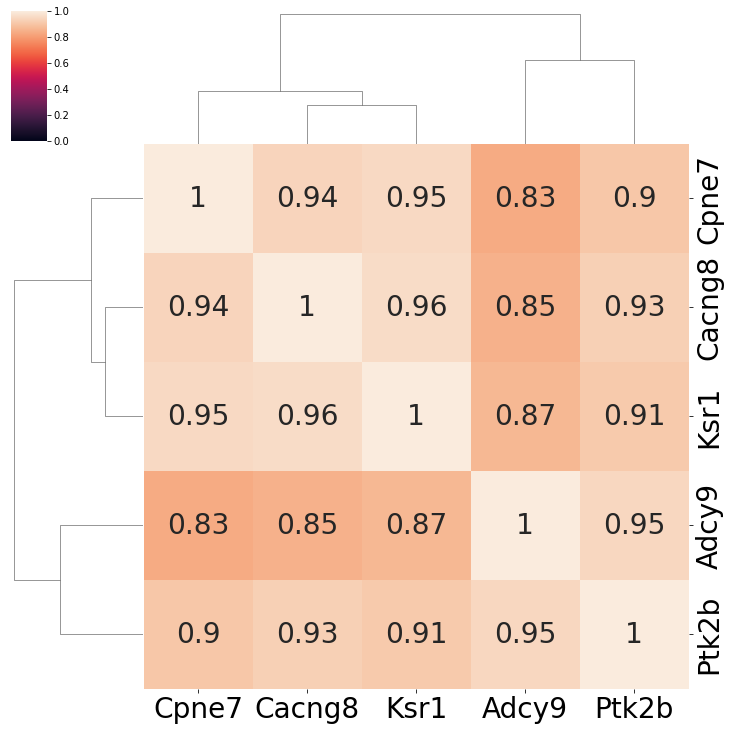

In [75]:
# 个别基因相似性展示
gene_list = ["Adcy9","Ptk2b","Cpne7","Cacng8","Ksr1"]
indexs = [np.where(angle_space_pd.index == gene_name)[0].tolist()[0] for gene_name in gene_list]
Gcorr = pd.DataFrame(Heatmap_Data_corr_cos[indexs,:][:,indexs],index=gene_list,columns=gene_list)

res = sns.clustermap(Gcorr,annot=True,vmin=0,vmax=1,annot_kws={"fontsize":28},)
res.ax_heatmap.set_xticklabels(res.ax_heatmap.get_xmajorticklabels(),fontsize = 28)
res.ax_heatmap.set_yticklabels(res.ax_heatmap.get_ymajorticklabels(),fontsize = 28,verticalalignment="center")
plt.show()
# plt.savefig('RNAseq-endothelial-cor.pdf')

In [ ]:
# fig = sns.clustermap(Heatmap_Data_corr,
#                     method="ward",
#                     metric="euclidean",
#                     row_cluster=True,
#                     col_cluster=True,
#                     xticklabels=False,
#                     yticklabels=False,cmap=sns.diverging_palette(270,20, n=70))
# fig.savefig("./tmp_new.png", dpi = 400)

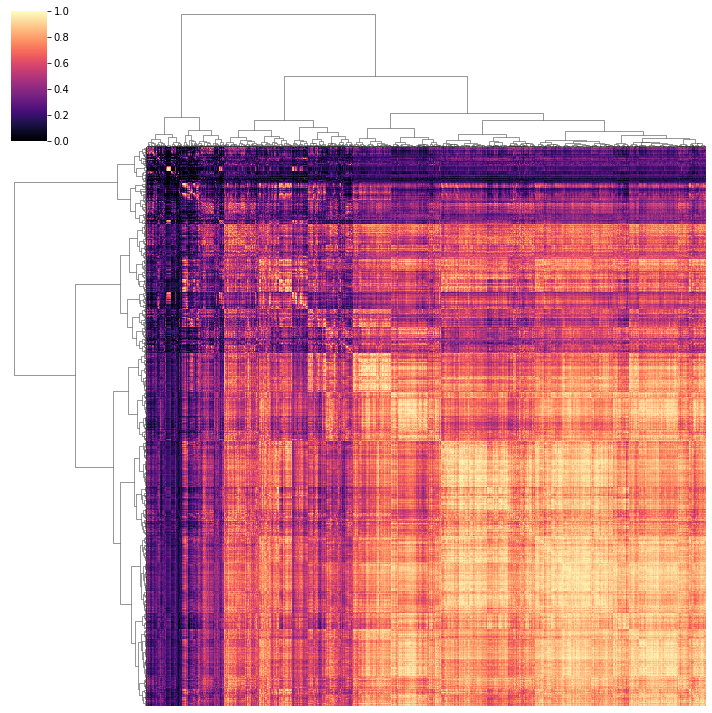

In [76]:
# 全部基因相似性展示
fig = sns.clustermap(Heatmap_Data_corr_cos,
                    method="ward",
                    metric="euclidean",
                    row_cluster=True,
                    col_cluster=True,
                    xticklabels=False,
                    yticklabels=False,cmap="magma")
fig.savefig("./tmp2_new_cos.png", dpi = 400)

In [77]:
# 查看某基因在聚类热图上的位置(index)
gene_name = "Zic1"
index = np.where(angle_space_pd.index == gene_name)[0].item()
index2 = np.where(fig.data2d.index.isin([index]))[0].item()
print(index2)

2856


3520
7491
8328
8448
830
4911
57
5975
7465
3101
6539
3840
169
712
1220
5610
2629
7927
1174
7880


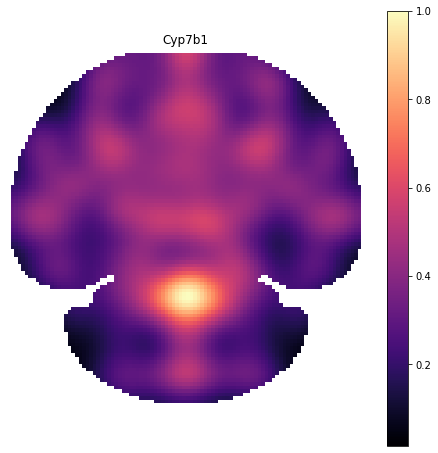

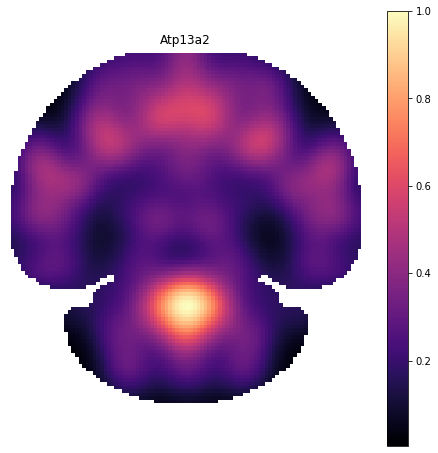

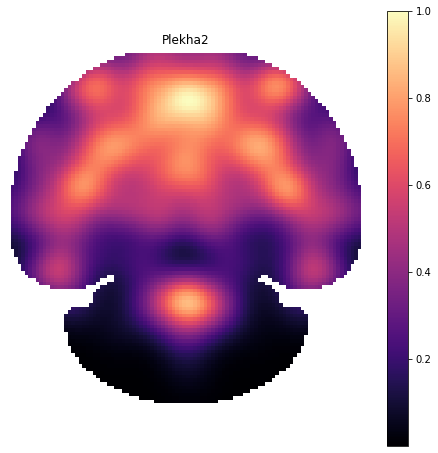

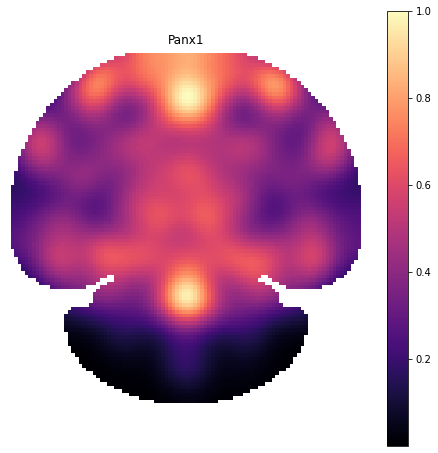

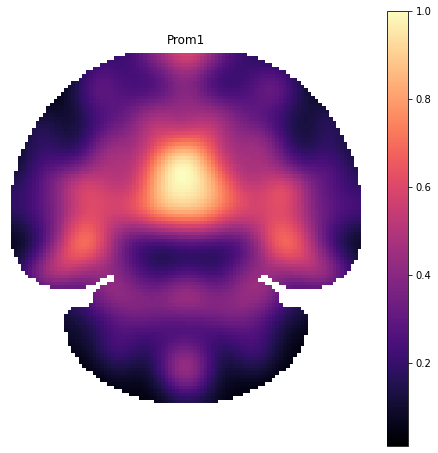

...

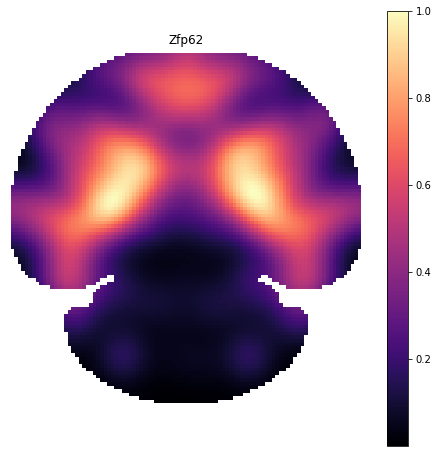

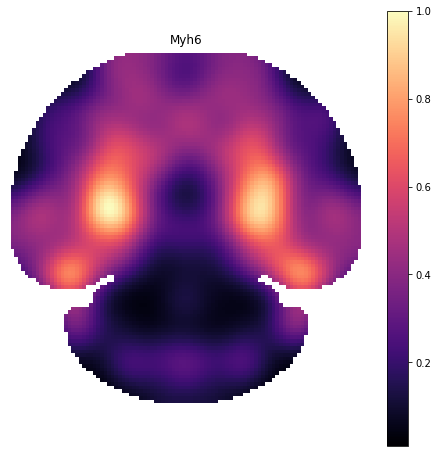

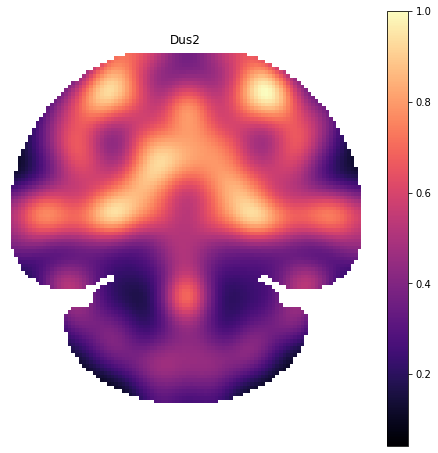

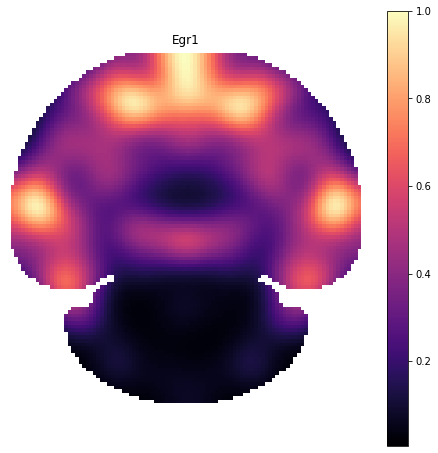

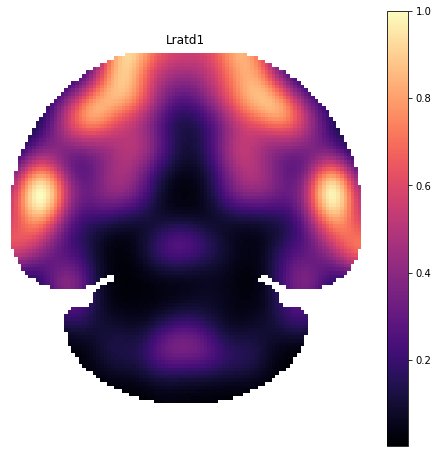

In [78]:
# 基于基因观察临近基因的表达分布
gene_name = "Cacng8"
index = np.where(angle_space_pd.index == gene_name)[0].item()
index2 = np.where(fig.data2d.index.isin([index]))[0].item()


for i in fig.data2d.index[(index2-10):(index2+10)]:
    
    index = i
    print(index)
    gene_name = angle_space_pd.index[index]
    # print(index[0].tolist()[0] in train_num.tolist())

    tmp_gene = model(data)[0].cpu().detach()[index,:].numpy()
    blurred = gaussian_filter(place_inside_mask(tmp_gene,mask_bw), sigma=5,)
    blurred = (blurred - blurred.min())/(blurred.max()+blurred.min())

    cmap = plt.cm.magma
    colored_image = cmap(place_inside_mask(blurred.flat[:][mask_bw.flat[:].astype(bool)],mask_bw),bytes=False)
    # colored_image = (colored_image - colored_image.min())/(colored_image.max()+colored_image.min())
    # plt.imshow(colored_image)
    # plt.show()

    img = np.full([100,100,3],1, dtype = np.float64)
    img[:,:,2].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,2].flat[:][mask_bw.flat[:].astype(bool)]*1
    img[:,:,0].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,0].flat[:][mask_bw.flat[:].astype(bool)]*1
    img[:,:,1].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,1].flat[:][mask_bw.flat[:].astype(bool)]*1

    plt.figure(figsize=(8,8))
    image = plt.imshow(img,cmap=cmap)
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.title(gene_name)
    plt.colorbar(image, orientation='vertical',)
    plt.show

3978
5905
5511
5487
6495
3178
3263
8445
5353
6147
4233
4471
3470
4139
6765
9057
3629
6713
5389
5489


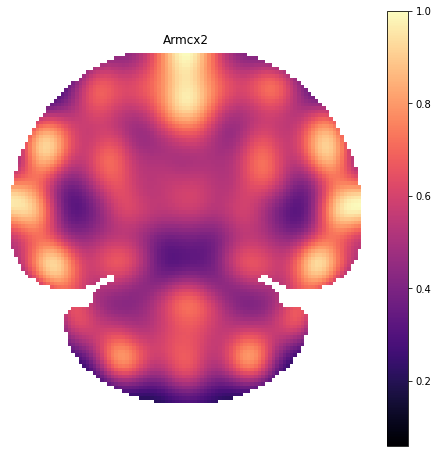

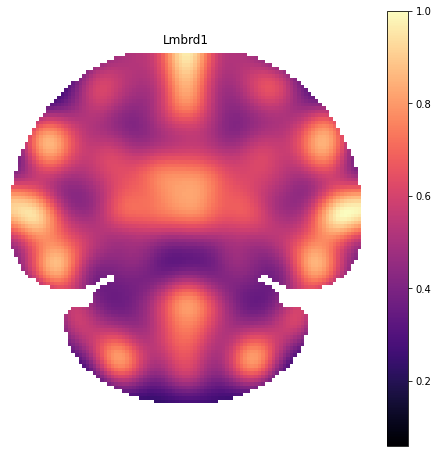

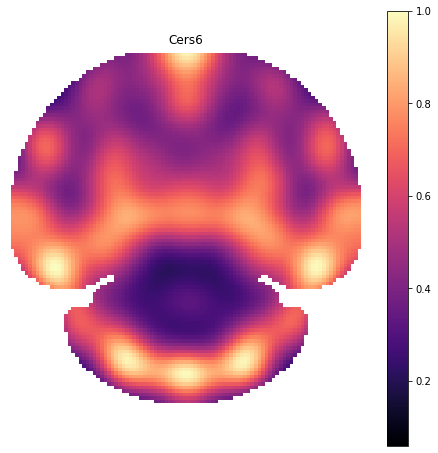

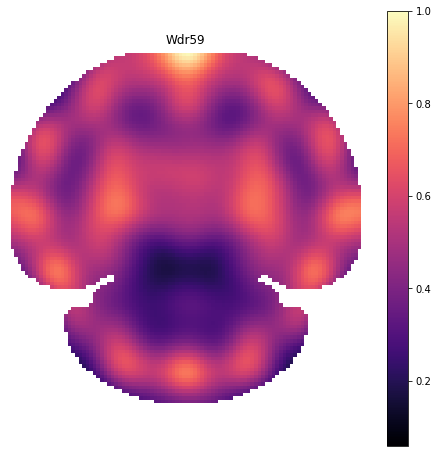

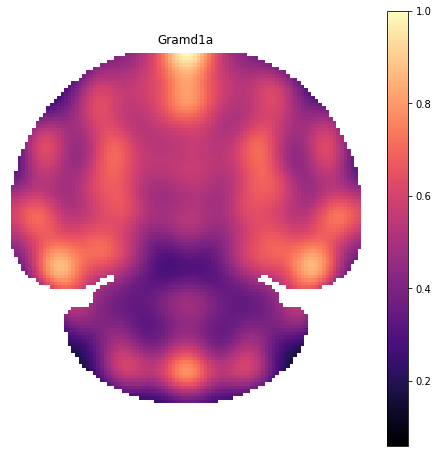

...

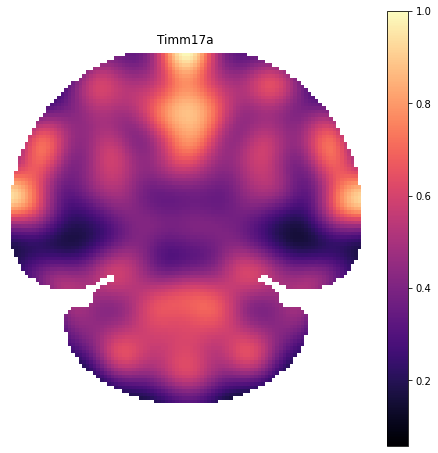

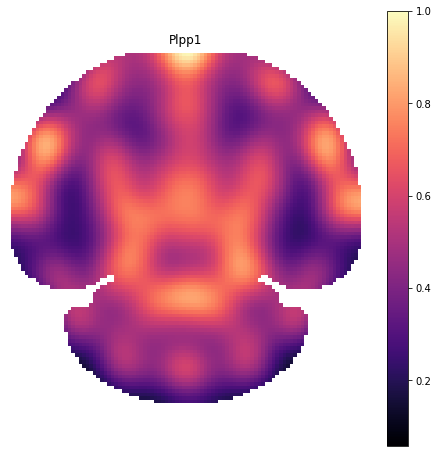

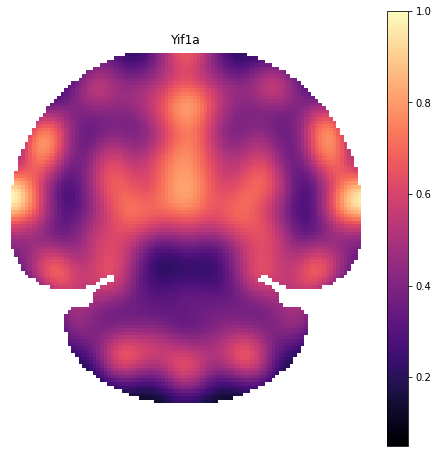

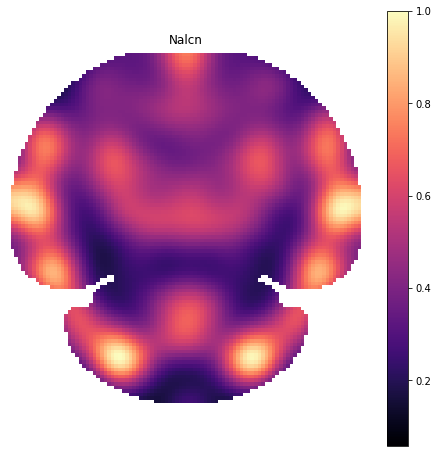

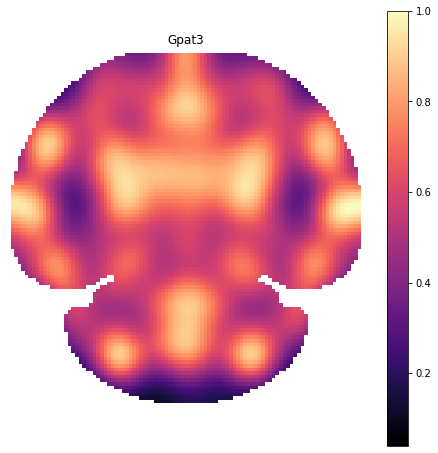

In [80]:
# 基于聚类热图位置观察临近基因的表达分布
index2 = 6000
for i in fig.data2d.index[(index2-10):(index2+10)]:
    
    index = i
    print(index)
    gene_name = angle_space_pd.index[index]
    # print(index[0].tolist()[0] in train_num.tolist())

    tmp_gene = model(data)[0].cpu().detach()[index,:].numpy()
    blurred = gaussian_filter(place_inside_mask(tmp_gene,mask_bw), sigma=5,)
    blurred = (blurred - blurred.min())/(blurred.max()+blurred.min())

    cmap = plt.cm.magma
    colored_image = cmap(place_inside_mask(blurred.flat[:][mask_bw.flat[:].astype(bool)],mask_bw),bytes=False)
    # colored_image = (colored_image - colored_image.min())/(colored_image.max()+colored_image.min())
    # plt.imshow(colored_image)
    # plt.show()

    img = np.full([100,100,3],1, dtype = np.float64)
    img[:,:,2].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,2].flat[:][mask_bw.flat[:].astype(bool)]*1
    img[:,:,0].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,0].flat[:][mask_bw.flat[:].astype(bool)]*1
    img[:,:,1].flat[mask_bw.flat[:].astype(bool)] = colored_image[:,:,1].flat[:][mask_bw.flat[:].astype(bool)]*1

    plt.figure(figsize=(8,8))
    image = plt.imshow(img,cmap=cmap)
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.title(gene_name)
    plt.colorbar(image, orientation='vertical',)
    plt.show

# 转录蛋白相关性

##### 蛋白层面

In [50]:
from scipy import ndimage
import matplotlib.pyplot as plt

In [51]:
def Output(data,model):
    return model(data)[0].cpu().detach().numpy()

def single_process(data,gene,x1,x2,y1,y2):
    tmp_gene = data[gene,:]
    blurred = gaussian_filter(place_inside_mask(tmp_gene,mask_bw), sigma=5,)
    blurred = (blurred - blurred.min())/(blurred.max()+blurred.min())
    
    full_img_33 = ndimage.rotate(blurred, -33, reshape=True)
    output = full_img_33[x1:x2,y1:y2]

    return output

In [52]:
Data = Output(data,model)

In [53]:
x1 = 40
x2 = 90
y1 = 43
y2 = int((x2-x1)*1.0545 + y1)


result_protein = []
for i in range(Data.shape[0]):
    result_protein.append(single_process(Data,i,x1,x2,y1,y2).flat[:].tolist())
    if i % 1000 ==0:
        print(i,"/",Data.shape[0])

0 / 9204
1000 / 9204
2000 / 9204
3000 / 9204
4000 / 9204
5000 / 9204
6000 / 9204
7000 / 9204
8000 / 9204
9000 / 9204


In [54]:
result_protein = np.array(result_protein)

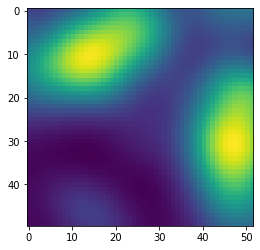

In [55]:
plt.imshow(result_protein[6539,:].reshape(50,52))

##### 转录层面

In [56]:
Spatial_Exp_matrix = pd.read_pickle("./Overlap/Spatial_Exp_matrix.pkl")

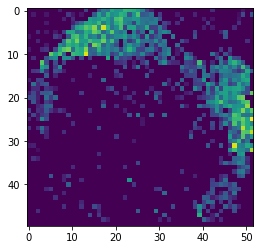

In [57]:
image = np.zeros([50,52])
image[Spatial_Exp_matrix["ROW"].to_numpy(),Spatial_Exp_matrix["COL"].to_numpy()] = Spatial_Exp_matrix["Lrrc10b"].to_numpy()

plt.imshow(image)
plt.show()

In [58]:
result_rna = []
for i in Spatial_Exp_matrix.columns[2:]:
    image = np.zeros([50,52])
    value = Spatial_Exp_matrix[i].to_numpy()
    image[Spatial_Exp_matrix["ROW"].to_numpy(),Spatial_Exp_matrix["COL"].to_numpy()] = (value-value.min())/(value.max()-value.min())
    result_rna.append(image.flat[:].tolist())

In [59]:
result_rna = np.array(result_rna)

##### 转录和蛋白 匹配和相关性计算

In [60]:
rna_genes = Spatial_Exp_matrix.columns[2:]
share_genes = np.intersect1d(rna_genes,angle_space_pd.index)

In [61]:
result_rna_index = [np.where(rna_genes == gene)[0].tolist()[0] for gene in share_genes]
result_protein_index = [np.where(angle_space_pd.index == gene)[0].tolist()[0] for gene in share_genes]

In [62]:
result_rna2 = result_rna[result_rna_index,: ]
result_protein2 = result_protein[result_protein_index,: ]

In [63]:
PR_corr = np.corrcoef(result_rna2,result_protein2)
PR_corr = PR_corr[:len(share_genes),len(share_genes):]

In [67]:
corr_order = np.argsort(np.diagonal(PR_corr))
corr_order = corr_order[::-1]
PR_corr2 = np.diagonal(PR_corr)

Corr: 0.5975527093339886


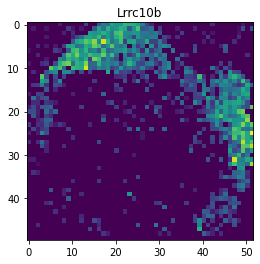

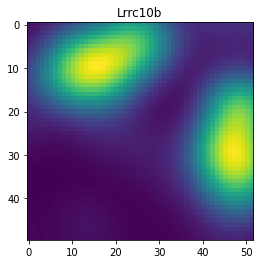

In [69]:
Num = 1
index = corr_order[Num-1]
print("Corr:",PR_corr2[index])
plt.imshow(result_rna2[index,:].reshape(50,52))
plt.title(share_genes[index])
plt.show()
plt.imshow(result_protein2[index,:].reshape(50,52))
plt.title(share_genes[index])
plt.show()

Num: 11
Corr: 0.49246009259107704


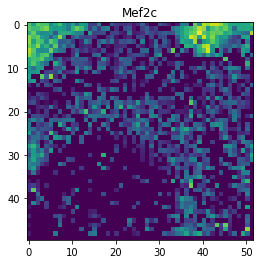

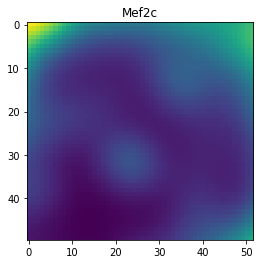

In [70]:
gene_name = "Mef2c"
index = np.where(share_genes == gene_name)[0].tolist()[0]
print("Num:",np.where(corr_order == index)[0].tolist()[0]+1)
print("Corr:",PR_corr2[corr_order[np.where(corr_order == index)[0].tolist()[0]]])
# index = 2786
plt.imshow(result_rna2[index,:].reshape(50,52))
plt.title(share_genes[index])
plt.show()
plt.imshow(result_protein2[index,:].reshape(50,52))
plt.title(share_genes[index])
plt.show()

(array([1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 2.000e+00, 0.000e+00,
        1.000e+00, 1.000e+00, 4.000e+00, 3.000e+00, 5.000e+00, 3.000e+00,
        1.700e+01, 1.500e+01, 2.200e+01, 5.300e+01, 6.900e+01, 1.370e+02,
        2.850e+02, 5.630e+02, 1.051e+03, 1.524e+03, 1.577e+03, 1.129e+03,
        7.320e+02, 4.170e+02, 2.670e+02, 1.860e+02, 1.280e+02, 1.050e+02,
        7.900e+01, 5.900e+01, 5.400e+01, 3.100e+01, 2.900e+01, 2.500e+01,
        2.100e+01, 1.900e+01, 1.900e+01, 1.300e+01, 9.000e+00, 9.000e+00,
        7.000e+00, 7.000e+00, 8.000e+00, 0.000e+00, 1.000e+00, 2.000e+00,
        0.000e+00, 2.000e+00]),
 array([-0.47458336, -0.45278642, -0.43098948, -0.40919254, -0.3873956 ,
        -0.36559865, -0.34380171, -0.32200477, -0.30020783, -0.27841089,
        -0.25661395, -0.23481701, -0.21302007, -0.19122313, -0.16942619,
        -0.14762925, -0.12583231, -0.10403536, -0.08223842, -0.06044148,
        -0.03864454, -0.0168476 ,  0.00494934,  0.02674628,  0.04854322,
         0.

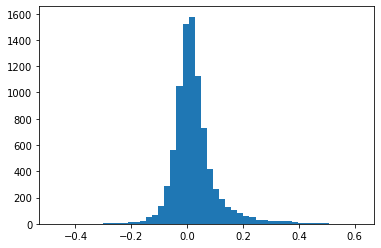

In [71]:
plt.hist(np.sort(np.diagonal(PR_corr)),bins=50)

/home/liyang/miniconda3/envs/cell2loc_env/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

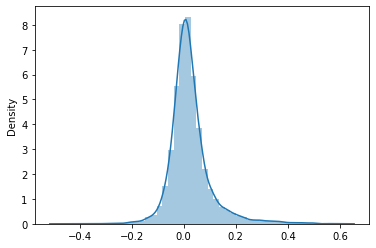

In [72]:
sns.distplot(np.sort(np.diagonal(PR_corr)))

In [73]:
gsea_data = pd.DataFrame([share_genes[corr_order],np.diagonal(PR_corr)[corr_order]]).T
gsea_data.columns = ["gene_name","corr"]
gsea_data.to_csv("gene_corr_gsea.tsv",sep="\t",index=False)

In [74]:
share_genes[corr_order][:100]

array(['Sparc', 'Lrrc10b', 'Baiap2', 'Vamp1', 'Gda', 'Phactr1', 'Hpca',
       'Slc6a11', 'Fbxl16', 'Nap1l5', 'Mef2c', 'Prkcb', 'Chn1', 'Nrgn',
       'Tph2', 'Gchfr', 'Tbr1', 'Foxg1', 'Atp2b1', 'Hpcal4', 'Homer1',
       'Pcp2', 'Ppp3ca', 'Ddn', 'Arpp19', 'Myl4', 'Inf2', 'Ptk2b',
       'Smpd3', 'Npy', 'Pde1a', 'Icam5', 'Dgkb', 'Kcnj10', 'Ngef', 'Gas7',
       'Drd1', 'Kcnip2', 'Klhl2', 'Plcb1', 'Cbln3', 'Stx1a', 'Atp1a1',
       'Satb2', 'Chrm1', 'Ppp1r17', 'Ppp1r1a', 'Wipf3', 'Plppr4', 'Hap1',
       'Rasgrp1', 'Pde2a', 'Slc17a6', 'Ankrd63', 'Dclk1', 'Sncg',
       'Camk2a', 'Cx3cl1', 'Tesc', 'Synpo', 'Mmp17', 'Camkv', 'Tmem132a',
       'Ache', 'Lzts1', 'Baiap3', 'Psd', 'Lmo3', 'Itpka', 'Kcnj4',
       'Pcbd1', 'Cdk17', 'Cck', 'AW551984', 'Cox6a2', 'Ppp1r9a', 'Arc',
       'Gng7', 'Camkk2', 'Cygb', 'Gpm6b', 'Tmem121b', 'Ttc9b', 'Mrtfb',
       'Sparcl1', 'Cnr1', 'Igfbp6', 'Arhgap33', 'Spata2l', 'Itih3',
       'Bcat1', 'Impact', 'Sipa1l1', 'Cnksr2', 'Synpo2', 'Sez6', 'Agap2',
     